In [1]:
%matplotlib inline
import numpy as np
import random as rd
import json
import copy
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import sys
from matplotlib import cm
from matplotlib.ticker import LinearLocator
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [2]:
print("Python version: {}".format(sys.version))
print("Matplotlib version: {}".format(matplotlib.__version__))

Python version: 3.12.3 | packaged by conda-forge | (main, Apr 15 2024, 18:20:11) [MSC v.1938 64 bit (AMD64)]
Matplotlib version: 3.10.0


# A NUMERICAL APPROACH TO FUNDAMENTAL PHYSICAL PROBLEMS


## Abstract

The aim of this report was to model some fundamental problems within the Physics and Engineering worlds' and optimise their parameters to visualise the properties of their solutions. We created a simulated annealing algorithm that found the minimum path for 30 US cities to be 2182.34, implementing a temperature schedule in order to cool our system down gradually. Also, a simple model for the Tacoma Narrows Bridge disaster was made and we investigated the relationship between the torsional angle $\theta$ and the vertical displacement $Y$ over time. We found the resonant frequency of our model of the bridge to be between 0.13 and 0.16 Hz which is at maximum a 35% difference between the literature value cited as 0.2 Hz.

## Introduction

Firstly, this report shall look at the optimisation of the Travelling Salesperson Problem (TSP). The aim of the Travelling Salesperson Problem involves finding a minimum path distance between 'n' nodes, starting from a randomly chosen node and passing through the other $n-1$ nodes exactly once - forming a Hamiltonian cycle.

The first known instance where the Travelling Salesperson Problem was mentioned in a German Hanbook that was published in 1832 called "Der Handlungsreisende - wie er sein soll und was er zu thun hat, um Auftraege zu erhalten und eines gluecklichen Erfolgs in seinen Geschaeften gewiss zu sein - Von einem alten Commis-Voyageur" (Weisstein, 2022). It has since been cited in several papers, but the first instance that the TSP was approached from a mathematical standpoint was in the 1800's by W.R. Hamilton and Thomas Kirkman in the form of Hamilton's Icosian Game (Gonzàlez-Santander, 2020), where the goal is to find a Hamiltonian cycle along the edges of a 2-dimensional planar graph of a Dodecahedron - which is the same as the solution to the TSP. However, the TSP was first studied by mathematicians in the 1930's (Cook, 2022) and has since been a vital cornerstone in our understanding of algorithms and optimisation.

Note that there are two general types of travelling salesman problems: symmetric and asymmetric. The asymmetric TSP involves the weight of $\overrightarrow{AB}$ to be different than the weight of $\overrightarrow{BA}$. A symmetric TSP involves the weight/distance between two nodes A and B to be the same in either direction i.e., two-way streets. This report shall be focusing on the symmetric TSP.

The TSP is described as an NP-hard problem, which is defined as a problem to which no solution exists in poylnomial time, such that an "algorithm for solving it can be translated into one for solving any NP-problem (nondeterministic polynomial time) problem". A problem is said to be solved in polynomial time if the computation time is less than a polynomial function of the input size (Terr, nd.). In the case of TSP the input values are the number of cities and given that the number of path permutations is n!, the time to find a solution will grow exponentially, not polynomially. Therefore a Heuristic* approach must be taken in order to obtain a solution, which comes in the form of the 2-opt/Pairwise Exchange algorithm.

The approach of this section is as follows: we shall find a random path between 'n' cities; define the temperature schedule and the probability function that we'll use; define functions for the length of the path. We will also devise a system in order to randomly shuffle the order of the path so that there is a higher chance of obtaining the global minimum distance, called the Pairwise Exchange function.

The Simulated Annealing Algorithm is an optimization technique that allows one to find global maxima or minima of a function that contains many local minima. It is a probabilistic algorithm that is based upon that of Annealing with metals: taking a molten metal and cooling it slowly so that it can reach its most stable 'state'. If one were to try and cool it instantly, it could lead to air bubbles or some impurities, resulting in a weaker, less optimal structure for the metal - this could be seen as a local minimum for the metal's strength (Rahman, Kaykobad, 2005). As a result, we shall introduce a Temperature Schedule. A Temperature Schedule is a probalistic technique that, put simply, reduces the probability of accepting undesirable solutions which, for the TSP, would be longer path lengths.

*Heuristic: a technique that involves trial and error until a solution is found.

Secondly, this report shall be considering the Tacoma Bridge Disaster and modelling the phenomena that led to the event. The Tacoma Bridge Disaster occured on November 7th 1940 in Tacoma, Washington - only months after its construction. At around 11am the bridge started to break, with it's complete failure following shortly after (History.com Editors, 2009). On that day there were exceptionally strong winds with a maximum speed of around $19 ms^{-1}$, which caused the bridge to start oscillating. The amplitude of these oscillations started to increase as a function of the force applied to the bridge - which itself is a funtion of the wind speed. The collapse of the bridge has been cited to be due to aeroelastic flutter (History.com Editors, 2009) which led to resonance of the bridge. The phenomena of resonance involves an object being subject to frequencies that match one of its many natural frequencies. An object can have many 'natural' frequencies dependent on the number of degrees of freedom that it has and when an object is experiencing forces at these frequencies, resonance occurs. In the case of the Tacoma Bridge disaster these resonant frequencies are caused by a driving force of wind, making the object vibrate/oscillate and drastically increase the amplitude of oscillation to its maximum; therefore inducing maximum torsional rotation, thus inducing maximum stress upon the structure - resulting in mechanical failure. The oscillations, whilst their amplitude does increase due to resonance, occur due to a process called Vortex Shedding. Vortex Shedding is a product of aeroelastic flutter and is the process in which wind near the resonant frequency of the object, passes over it (in this instance: the bridge) and vortices are created, thus creating areas of low pressure around the object, resulting in very large oscillations for small forces of wind (Hillhouse, 2019). However to retain mathematical simplicity within this report, we shall model the wind as a force that solely acts in the y-direction.

While the aim of modelling the Tacoma Narrows Bridge disaster is to analyse the bridge's behaviour under a driving force, another purpose is compare approximation techniques for ordinary differential equations - in particular: the Taylor and Cromer Methods. These approximation methods are useful for when the ODE's have no known solution and so a specific ansatz is assumed and, if given a set of initial conditions, the coefficients of the equation can be found. But, we shall discuss this in more detail later in the report.

## Example 1 : The Travelling Salesperson Problem

###### `Miscellaneous`

In [3]:
map = mpimg.imread("map.png") # map of United States
with open('capitals.json', 'r') as capitals_file:
    capitals = json.load(capitals_file) # imports and loads the list of state capitals
capitals_list = list(capitals.items()) # list of the capital cities of some US States
capitals_list = [(c[0], tuple(c[1])) for c in capitals_list] # separates the coordinates from the city name

## Background
Using "brute force" in order to obtain the minimum path for this is computationally expensive and hence necessitates the use of an optimisation algorithm. For example, take 'n' cities and the number of available paths from this start point will be $n$, and then from the next point the number of possible paths will be $(n-1)$ - since the random walk must also be simple*. Following this pattern, the total number of paths will be:

$$n! = n \times (n-1) \times (n-2) \times... \times 1 \tag1$$

*simple: containing no loops or repeated vertices
*Hamiltonian cycle: a loop that vists each node only once and returns to its start node (Rahman & Kaykobad, 2005).

From this, one can deduce that the number of permutations of possible paths becomes astronomical as $n$ increases. For instance if we had a computer that could run and check 1 billion paths per second and tried to use an exhaustion method of brute force with 30 cities, then the time it will take to complete would be $\frac{30!}{10^9}$ seconds or $8.4\times10^{15}$ years - which is approximately 610,000 times the age of the universe! Therefore we must find an alternative method to obtain a minimum path -  and we shall use a deterministic approach of a 2-opt method, which shall translate this np-hard problem into a problem that can be solved in poylnomial time.

One possible way to reduce the computational stress upon the Pairwise Exchange algorithm is to start with a path that is formed with an initial 'greedy' algorithm. A Greedy algorithm for obtaining a minimum path is to choose the next vertex that is of closest Euclidean distance to the current vertex. Statistically, using a 'greedy' minimum path shall have a lower path distance than a path that is generated randomly with uniform distribution. This is due to the 30! permutations available of the initial random path as shown in Equation (1).

### The Simulated Annealing Algorithm:

The Simulated Annealing process is one which that involves using probability to accept or reject the potential next state of the system. Translating this across to the Travelling Salesperson Problem, if we 'cool' our system very quickly then it will lead to a sub-optimal path length and a local minimum. However if we create a Temperature Schedule, which will decrease as time increases, then we can cool our system slowly; increasing the liklihood of obtaining the global minimum. The Simulated Annealing Alogrithm is an example of a Monte Carlo method - which is a probabilistic algorithm that is used study the set of possible solutions to a problem based on an initial set of conditions. Monte Carlo methods are useful for solving problems that have a large number of degrees of freedom (Amar, 2006). Since final algorithm for the TSP has 4 degrees of freedom, i.e., four variable inputs, a Monte Carlo method would be best suited.

Now that we know what Annealing entails, we want to implemenet this process into our problem. To do this, we will make a series of attempted pairwise exchanges which is shown by the function `pairwise`.

#### Generating a Random Path:
To generate a random path, we first need a list of the places that we're generating the path between. This is shown by the list `capitals_list`, which contains a tuple of the cities' names and their co-ordinates ona cartesian grid, in reference to the dimensions of the 'map' that we imported in the `miscellaneous` section of this report. From this list of tuples, we are able to define a function that takes a random sample 'N' times from the specified list with uniform distribution and without replacement (Pynative, 2019), which is important since the problem requires 'N' different cities.

In [4]:
def random_path(N):
    global rnd_cities # this creates a global variable that can also be used outside of this function
    rnd_cities= rd.sample(capitals_list, N) # creates an array of 'a' cities chosen from 'capitals_list' according to a uniform distribution
    return rnd_cities # returns the random list

random_path(8) # Here shows a test of our function with 'a' cities

[('Columbia', (632.4, 364.8)),
 ('Hartford', (719.6, 205.2)),
 ('Salt Lake City', (204.0, 243.2)),
 ('Lansing', (563.6, 216.4)),
 ('Richmond', (673.2, 293.6)),
 ('Columbus', (590.8, 263.2)),
 ('Boise', (159.6, 182.8)),
 ('Little Rock', (469.2, 367.2))]

#### Pairwise Exchange Function

In [5]:
def pairwise(path):
    path2 = path.copy() # copies the input path

    x = rd.randint(0,len(path)-1) # randomly chooses a number to represent an index of the input path
    y = rd.randint(0,len(path)-1) # as above
    
    if x == y:
        pairwise(path) # if x=y the same cities shall be swapped, so perform the function again

    if x != y: 
        path[x] = path2[y] # replace the x-th and y-th indices on both paths to swap them
        path[y] = path2[x]
    return path # returns the path after the pairwise swap

The function above involves taking a copy of the input path and to create variables 'x' and 'y' which can take any integer from zero to one less than the length of the list 'path' via a discrete uniform distribution. Using (0,len(path)) with e.g. N elements in the list would have arguments (0,N) inclusive, meaning N+1 possible integers (including 0) but only N possible arguments of the list, hence we use (0,len(path)-1).

The function has a simple purpose: if the two integers generated (x and y) are different, then the x-th argument of 'path' shall swap with the y-th argument of 'path2', and vice-versa with the y-th argument of 'path' being swapped with the x-th argument of 'path2'. Hence, this shall result in two cities being swapped and the output will be the changed path.

Given that 'path2' is a direct copy of the input path then if x is equal to y, the output will be unchanged; the same city shall be swapped between the two paths. Therefore, the function says that if this occurs, then it will go back to the beginning of the function and try again, until it reaches a condition where 'x' and 'y' are different integers.

#### Probability of Pairwise Exchange:
We shall accept or reject the attempted Pairwise Exchange in accordance with the following exponential equation:


$$ P = e^{ - \left( d_{new} - d_{old}  \right) / T } \tag2 $$


where $d_{new}$ and $d_{old}$ are the new and old overall path length respectively (i.e., pre- and post-pairwise exchange) and $T$ is the "Temperature" which shall be defined below.

We should recall that $T$ is not a physical temperature, but merely an indicator of how likely we are to accept or reject the attempted pairwise exchange. Due to the nature of the exponential equation for Temperature Schedule and proposed value for $\alpha$ ($ \alpha < 1 $), $T$ will decrease over time resulting in a general lower probability (P) of accepting the attempted Pairwise Exchange as time progresses.

#### Temperature Schedule:

We will define the temperature schedule as a simple polynomial decay of the form:

$$T(t) = \alpha^t T_0 \tag3 $$

With T(t) = Temperature, $\alpha$ = decay parameter, t = timestep, $T_0$ = initial Temperature

In the cell below, we have defined a function that succesfully employs Equation (3) and returns a Temperature Schedule.

In [6]:
def temp(T0, α, timestep):
    T = (α**timestep)*T0 # use the equation given. T0 = intial temperature, timestep = time, α = decay parameter
    return T

As shown in Equation (3): for values of $\alpha$ less than one, $T(t)$ will decrease for increasing values of $t$. Now looking at Equation (2), this decreasing temperature schedule $T(t)$ will result in a general increase in the . The Temperature Schedule is vital to the success of the Annealing Algorithm since it allows the solution space to be explored earlier on in the algorithm and thus increases the potential to make significant (and more favourable) changes to the path. Since the Temperature Schedule is of a decreasing nature, and also referring to Equation (2), we can see that it narrows down its 'search' for the global solution as time progresses. The Temperature Schedule acts as a cooling gradient (which is indicative of $\alpha$ and dictates how 'steep' the algorithm shall converge to a solution.

#### Obtaining the Coordinates of Cities:

In [7]:
def coords(path):
        _, coords = zip(*path)
        return coords

The cell above defines a functions to return the coordinates of the path, taking the input path which contains a series of tuples which contain a city and its coordinates in relation to the dimensions of the `map` file used in this report.

#### Overlaying the Path onto an image:

In [8]:
def show_path(path_, starting_city, w=35, h=15):
    path=coords(path_) 
    x, y = list(zip(*path))
    
    _, (x0, y0) = starting_city
    
    plt.imshow(map)
    plt.plot(x0, y0, 'y*', markersize=15)  # y* = yellow star for starting point
    plt.plot(x + x[:1], y + y[:1])  # include the starting point at the end of path
    plt.axis("off")
    fig = plt.gcf()
    fig.set_size_inches([h,w])

The function written above takes an image and its size and turns it into a coordinate system. The path that we will calculate is then overlayed ontop of the image, for the purpose of visualisation - allowing us to alter the input parameters using intuition.

### Distance-Temperature Graph:

Below, we shall define a function which presents the data in the `D` and `Temps` arrays. From this, we are able to see the relationship between the path length and Temperature Schedule. This will help us to figure out the optimal pararmeters for the algorithm i.e., how the value and sign of $\alpha$ affects the convergence rate.

In [9]:
def plot():
    plt.plot(Temps, D) # plots temperature on x-axis and Distance on y-axis
    plt.xscale("log") # use log-log scales for x and y
    plt.yscale("log") 
    plt.xlabel('Temperature')
    plt.ylabel('Distance')
    plt.title('Temperature - Distance for each successful pairwise exchange')
    plt.gca().invert_xaxis() # x-axis inversion
    plt.show();
    
    print('The local minimum distance obtained from this iteration for this path is {0}.'.format(D[-1]))

In the cell below, we can see the `random_path()` and `show_path()` function in motion, providing a visual representation of the random path generated and overlayed onto the image of the map.

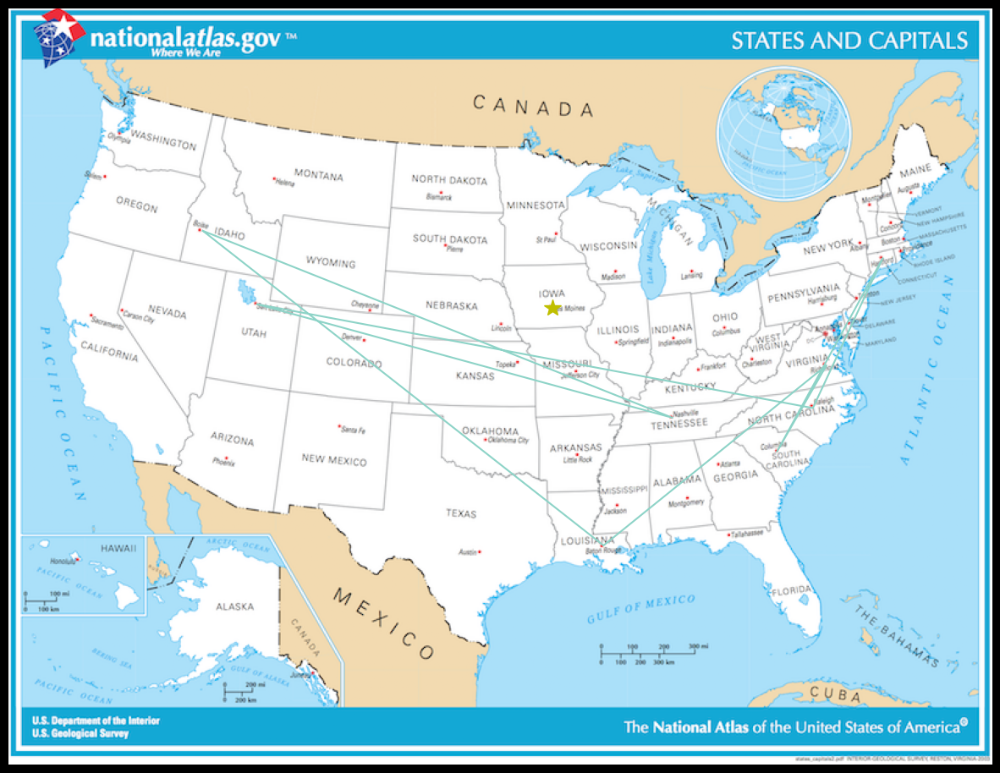

In [10]:
show_path(random_path(8),random_path(8)[0]) # test the show_path function

Notice that first argument in the `show_path` function is the 'starting city'. This is so that the `random path` generated becomes simply connected and is therefore Hamiltonian.

As previously stated, obtaining a 'random' path via the Greedy algorithm could provide a locally optimal solution and hence may lead to a local minima in a more efficient way than generating a random path, thus possibly reducing the computational stress by the Pairwise Exchange function and reducing the need to find completely optimal parameters. A 'greedy' algorithm involves connecting a node that is the shortest distance away from the current node and repeating the process.

#### Defining the Path Length:

In [11]:
def length(path):
    
    length = 0 # initialise a variable to assign lengths to.
    
    total_path = list(path) + [path[0]] # add the first node of the list to the end the list to ensure the path
    #                                     is closed and a Hamiltonian cycle
    
    pair = zip(total_path, total_path[1:]) # pairs together each node with every other node within the list
                                            # and assigns them to a variable
    
    for a,b in pair: # assessing each possible node pairing within the list
        x1 = (a[1][0]) # x-value of the first coordinates in the pair
        y1 = (a[1][1]) # y-value of the first coordinates in the pair
        x2 = (b[1][0]) # x-value of the second coordinates in the pair
        y2 = (b[1][1]) # y-value of the second coordinates in the pair
        
        d = np.sqrt((x1-x2)**2 + (y1-y2)**2) # use Pythagoras' Theorem to obtain the Euclidean distance between 
        #                                      the two nodes
        
        length += d # for each a,b in pair, add the distance to the already initialised 'length' variable
                    # length = length + d
        
    return length # returns the length variable

The function defined above takes an initial argument of an input path and intialises a variable called 'length'. To obtain the lenght of the path, first we need to close the path such that it forms a loop and so we add the starting city to the end of the path.
Then, find the x and y coordinates of a city and its adjacent city in the path array. We then use Pythagoras' Theorem to calculate the Euclidean distance between these two cities. We update the 'length' variable by adding this value and then repeat for all other cities in the list.

#### Defining the Annealing Function:

In [12]:
def anneal(α, T0, N, dt):

    # initialise the variables
    global D, path, Temps # creates global variables in order to access them outside of the function -
    #                                                            (i.e, plotting graphs)
    D = [] # accepted distances
    Temps = [] # accepted temperatures
    
    path = random_path(N) # generate random path for 'N' cities

    for i in range(dt): # 0-199 ; 200 iterations in total
        T = temp(T0, α, i) # temperature schedule
        
        rd_num = rd.uniform(0,1) # uniform distribution to obtain a random number
        
        d_old = length(path) # 'old' length is the current path length
        
        newpath = pairwise(path.copy()) # new path is constructed from a pairwise exchange of a copy of the current path
        
        d_new = length(newpath) # length of path after the pairwise exchange
        
        P = np.exp(-(d_new - d_old)/T) # arms the exponential probability function 
        
        if P >= rd_num: # acceptance of pairwise exchange
            path = newpath # the 'old path' variable gets updated with the 'pairwise exchange' path
            Temps.append(T) # append the accepted temperature
            D.append(d_new) # append the accepted temperature

Now, we'll run the Annealing algorithm to try and find a minimum path for `8` cities.

C:\Users\ellio\AppData\Local\Temp\ipykernel_11440\553918473.py:22: RuntimeWarning: overflow encountered in exp
  P = np.exp(-(d_new - d_old)/T) # arms the exponential probability function


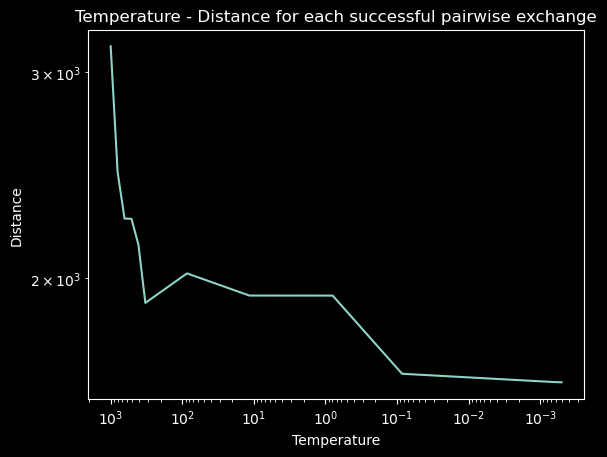

The local minimum distance obtained from this iteration for this path is 1629.8396067424444.


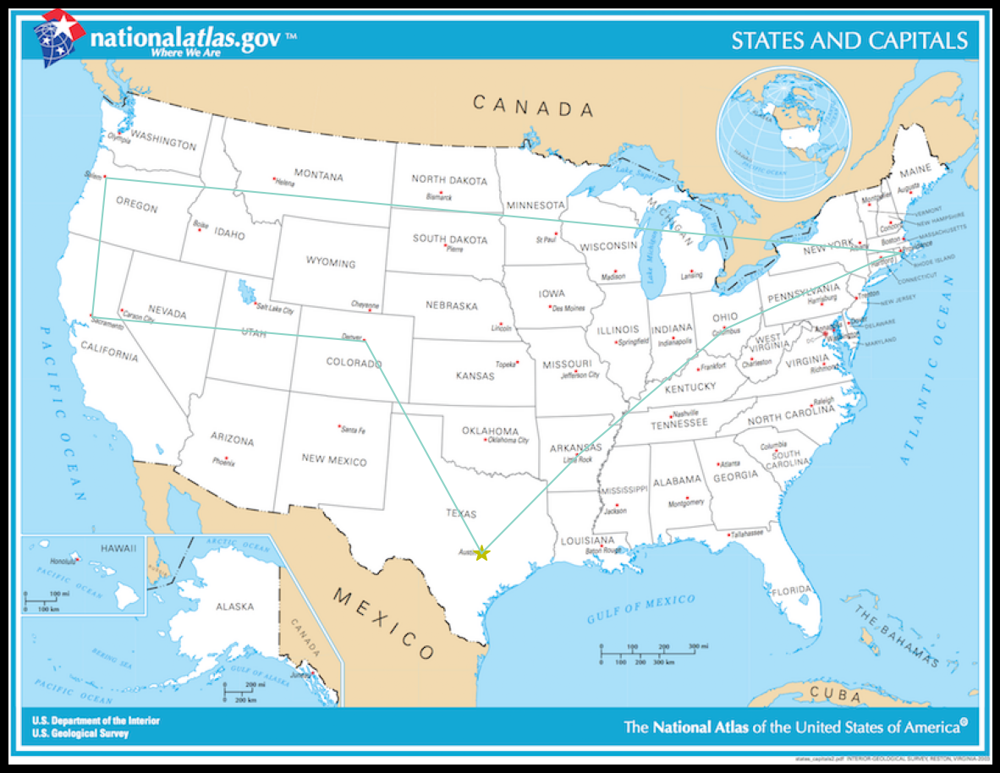

In [13]:
anneal(.8,1000, 8, 200)
plot()
show_path(path,path[0])

The function above takes the theory of annealing and applies it to the randomly generated path.

##### Testing the annealing function for small values 'N':

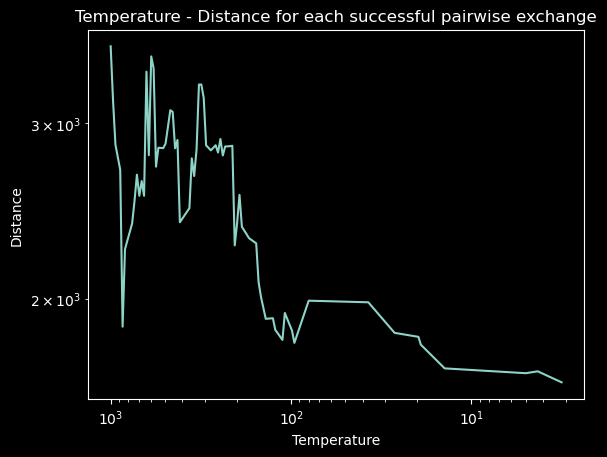

The local minimum distance obtained from this iteration for this path is 1648.4393502758683.


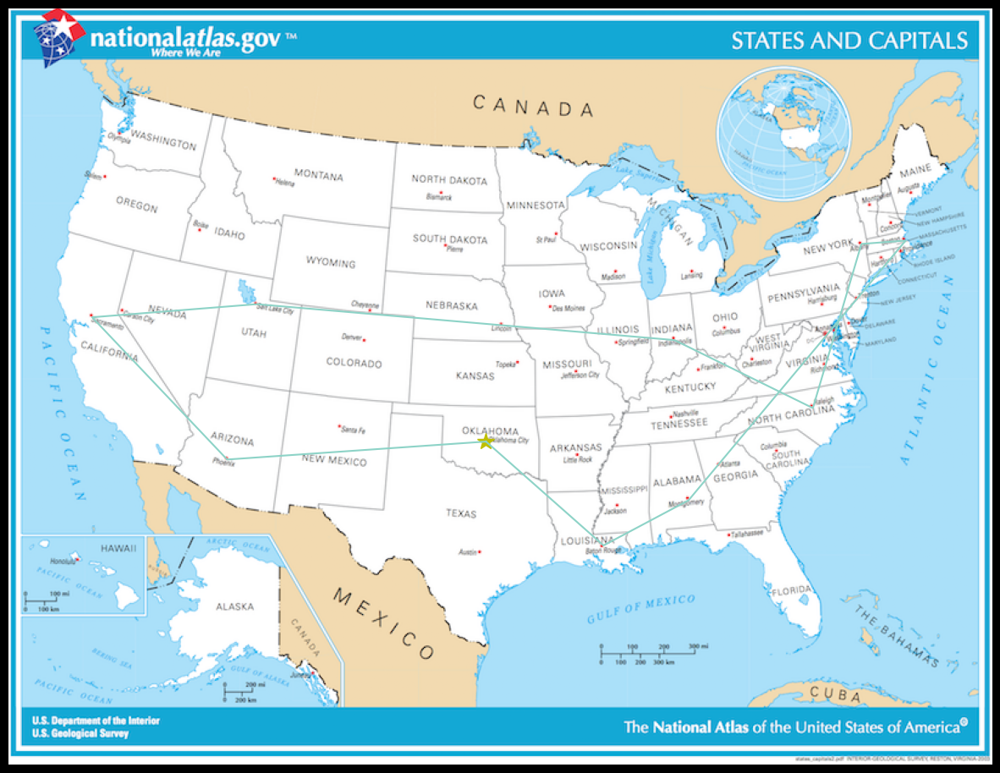

In [14]:
anneal(α = 0.97, T0 = 1000, N = 10, dt = 200)
plot()
show_path(path,path[0])

### Comparing Convergence Rates:
It is important to find an optimal convergence rate $\alpha$ since it will determine how computationally expensive the code will be. The value of $\alpha$ shall also determine the rate of cooling of the system. For example, a large $\alpha$ shall have a very small negative gradient and shall attempt to traverse most of the graph before converging to a local minima, but shall take a large amount of time. A small $\alpha$ shall have a large negative gradient and so will converge to a minima very quickly, meaning that it will not spend long exploring the solution space, increasing the liklihood of obtaining a local minima rather than a global minima. 

C:\Users\ellio\AppData\Local\Temp\ipykernel_11440\553918473.py:22: RuntimeWarning: overflow encountered in exp
  P = np.exp(-(d_new - d_old)/T) # arms the exponential probability function


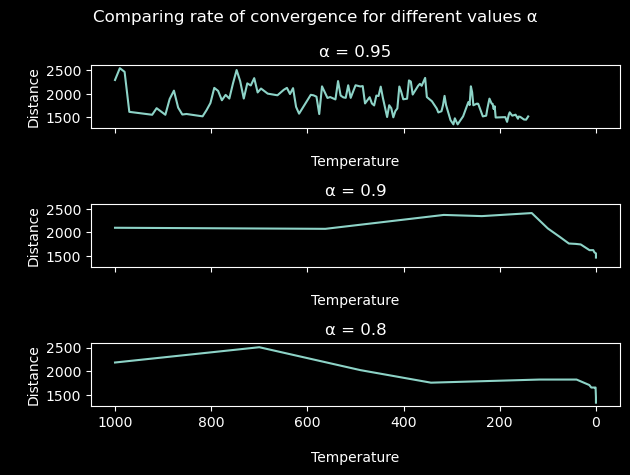

In [15]:
fig, axs = plt.subplots(3, sharex=True, sharey=True)
fig.suptitle('Comparing rate of convergence for different values α')

anneal(α = 0.99, T0 = 1000, N = 8, dt = 200)
axs[0].plot(Temps, D)
axs[0].title.set_text('α = 0.95')

anneal(α = 0.75, T0 = 1000, N = 8, dt = 200)
axs[1].plot(Temps, D)
axs[1].title.set_text('α = 0.9')

anneal(α = 0.7, T0 = 1000, N = 8, dt = 200)
axs[2].plot(Temps, D)
axs[2].title.set_text('α = 0.8')

for ax in axs.flat:
    ax.set(xlabel='\nTemperature', ylabel='\nDistance')

fig.gca().invert_xaxis() # inverts x-axis, useful for clearer visual anaylsis

fig.tight_layout()
plt.show();

Above, we can see that the rate of convergence is greater for smaller values of $\alpha$, given the exponential nature of the Temperature Schedule. We can see from the Figures above that the number of timesteps required to reach a local minimum iteration of the function decreases ith the reducing value of $\alpha$.

A lower value for $\alpha$ will result in a reduction in the values for the Temperature Schedule $T(t)$. In accordance with the probability equation we have used to accept or reject the Pairwise Exchange (Equation (2)), the reduced Temperature Schedule (Equation (3)) will result in a lower probability output $P$ than that of a higher value for $\alpha$ (for the same attempted Pairwise Exchange). For a lower value for $P$, it is clear that there is a higher acceptance threshold for the Pairwise Exchange.

Thus, we can make the general assumption that in most attempted exchanges, there is a higher liklihood of the Pairwise Exchange being accepted; which can have both positive and negative implications. This is visible in the Figure above: as $\alpha$ decreases, the path becomes more linear and there are fewer increases in the distance - which increases the efficiency of the algorithm.

For example, a positive implication would be that there is a higher convergence rate for instances of Annealing with a smaller $\alpha$, which may help if, for example, the problem requires a large number of 'cities'. It will, however, also give a sub-optimal result: a local minima. Whilst the distance shall converge to a minimum, if $\alpha$ is small, then it shall be a local minimum.

To visualise this, we shall create a 'noisy' function below to look at local maxima and minima:

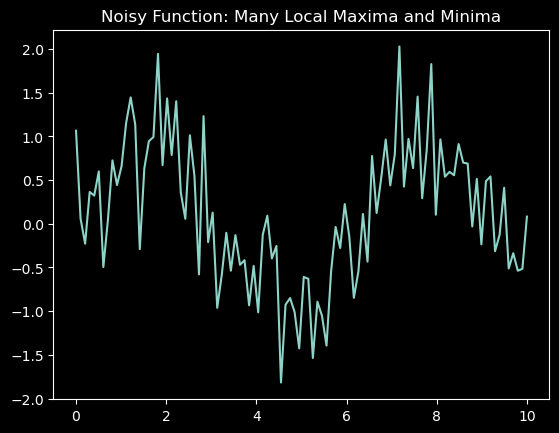

In [16]:
# Generating a noisy function with local maxima and minima
x = np.linspace(0, 10, 100)
y = np.sin(x) + np.random.normal(0, 0.5, 100)

plt.plot(x, y)
plt.title('Noisy Function: Many Local Maxima and Minima')
plt.show();

If we look at the figure above, there are many local maxima and minima (as well as global). If we associate the value of the $\alpha$ to the value of the gradient of a line that "bounces" between the parts of the function, then we can see that an extremity of a too high/low value for $\alpha$ and is therefore undesirable.

If $\alpha$ is too large, then the algorithm will not have enough time to explore the solution space, producing a convergence at local minima. If $\alpha$ is too large, then this will result in a long convergence time and an unnecessary run time for the code. Hence, a "middle-ground" between these two extremes must be found for $\alpha$.

For small number of nodes `N`, the input parameter values aren't as important as they would be for large values of `N`. This is because the number of permutations possible increases as a function of $n!$ and so there are so fewer local minima for small values `N`. However for large values `N` the number of permutations increase exponentially and hence so does the number of local minima. Therefore, a set of optimal parameters must be found when using the algorithm for larger values of `N`.

#### Simulating the Annealing Algorithm for 20 cities:
Now, we shall simulate the annealing algorithm for 20 cities and change the input parameters each time that we run it.

C:\Users\ellio\AppData\Local\Temp\ipykernel_11440\553918473.py:22: RuntimeWarning: overflow encountered in exp
  P = np.exp(-(d_new - d_old)/T) # arms the exponential probability function


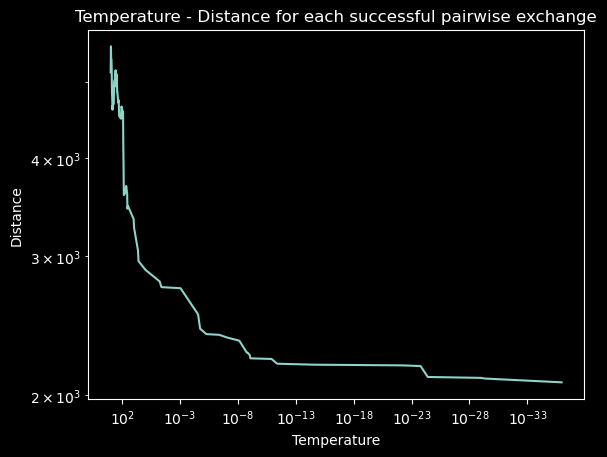

The local minimum distance obtained from this iteration for this path is 2076.1101432401774.


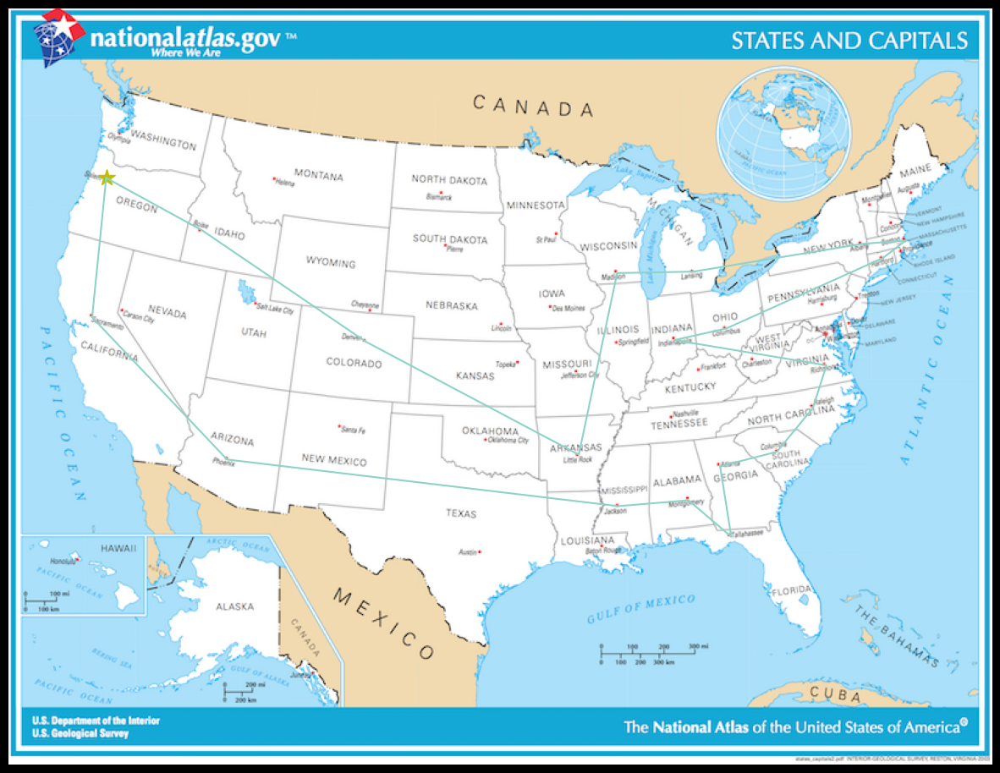

In [17]:
anneal(α = 0.95, T0 = 1000, N = 20, dt = 2000)
plot()
show_path(path, path[0])

C:\Users\ellio\AppData\Local\Temp\ipykernel_11440\553918473.py:22: RuntimeWarning: overflow encountered in exp
  P = np.exp(-(d_new - d_old)/T) # arms the exponential probability function
C:\Users\ellio\AppData\Local\Temp\ipykernel_11440\553918473.py:22: RuntimeWarning: overflow encountered in scalar divide
  P = np.exp(-(d_new - d_old)/T) # arms the exponential probability function
C:\Users\ellio\AppData\Local\Temp\ipykernel_11440\553918473.py:22: RuntimeWarning: divide by zero encountered in scalar divide
  P = np.exp(-(d_new - d_old)/T) # arms the exponential probability function


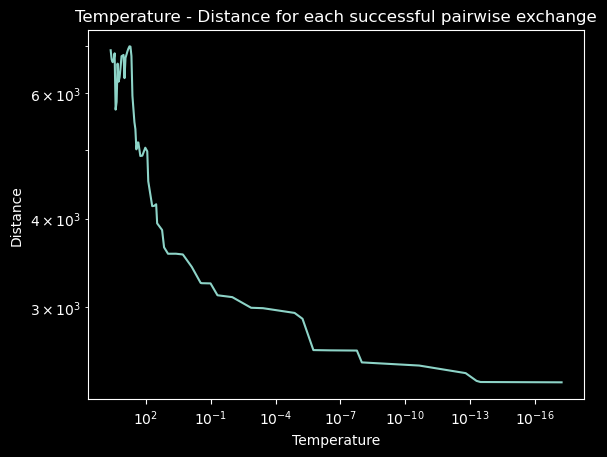

The local minimum distance obtained from this iteration for this path is 2351.943213353046.


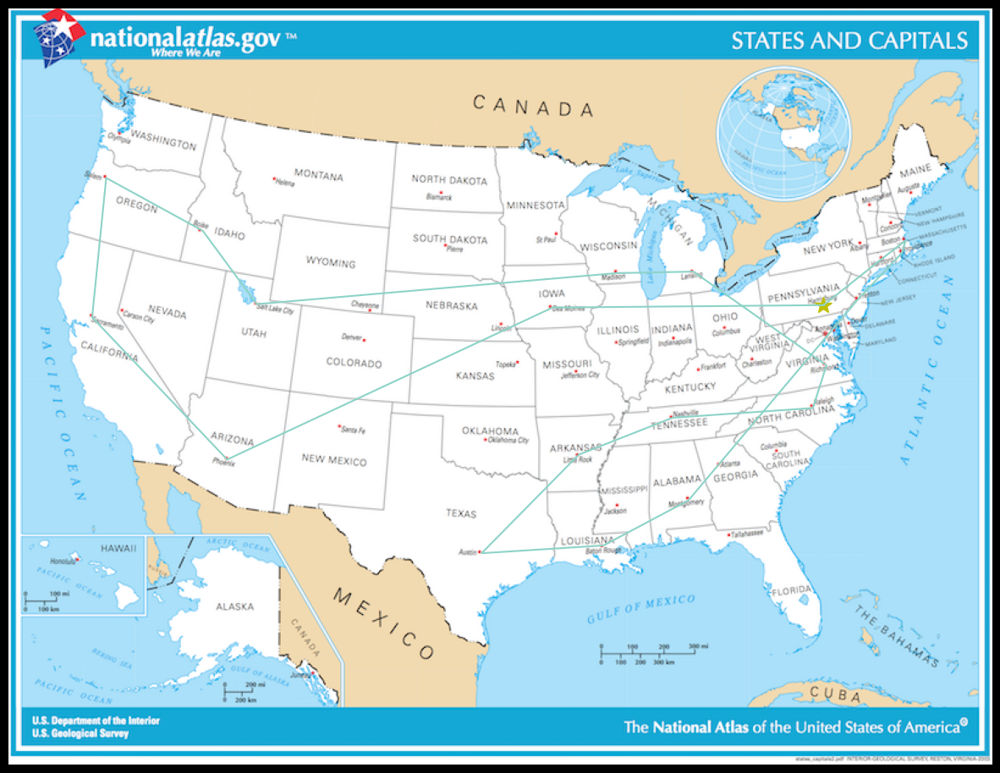

In [18]:
anneal(α = 0.9, T0 = 4300, N = 20, dt = 9000)
plot()
show_path(path, path[0])

C:\Users\ellio\AppData\Local\Temp\ipykernel_11440\553918473.py:22: RuntimeWarning: overflow encountered in exp
  P = np.exp(-(d_new - d_old)/T) # arms the exponential probability function
C:\Users\ellio\AppData\Local\Temp\ipykernel_11440\553918473.py:22: RuntimeWarning: overflow encountered in scalar divide
  P = np.exp(-(d_new - d_old)/T) # arms the exponential probability function
C:\Users\ellio\AppData\Local\Temp\ipykernel_11440\553918473.py:22: RuntimeWarning: divide by zero encountered in scalar divide
  P = np.exp(-(d_new - d_old)/T) # arms the exponential probability function


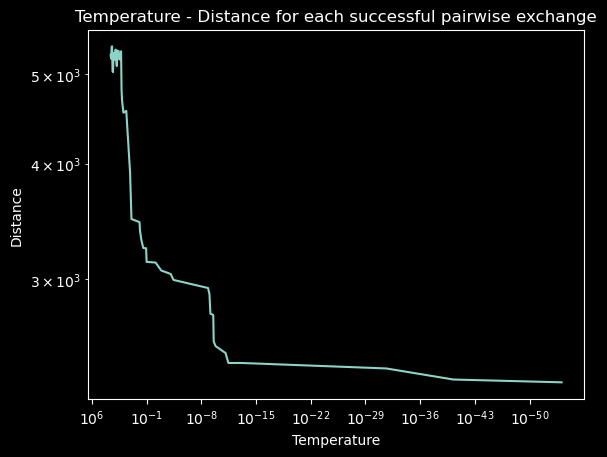

The local minimum distance obtained from this iteration for this path is 2321.3636167305276.


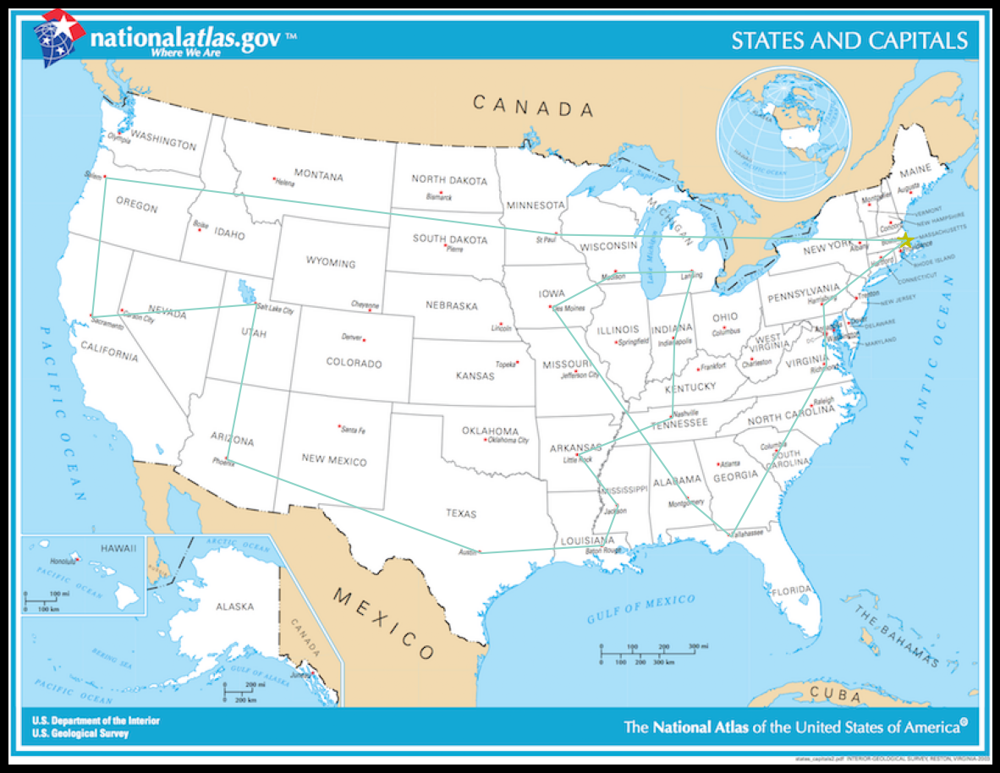

In [19]:
anneal(α = 0.87, T0 = 4000, N = 20, dt = 7700)
plot()
show_path(path, path[0])

#### Simulating the Algorithm for all nodes in 'capitals_list':
Below, the annealing algorithm is run for all 30 cities in 'capitals_list' to search for a minimum path.

C:\Users\ellio\AppData\Local\Temp\ipykernel_11440\553918473.py:22: RuntimeWarning: overflow encountered in exp
  P = np.exp(-(d_new - d_old)/T) # arms the exponential probability function
C:\Users\ellio\AppData\Local\Temp\ipykernel_11440\553918473.py:22: RuntimeWarning: overflow encountered in scalar divide
  P = np.exp(-(d_new - d_old)/T) # arms the exponential probability function
C:\Users\ellio\AppData\Local\Temp\ipykernel_11440\553918473.py:22: RuntimeWarning: divide by zero encountered in scalar divide
  P = np.exp(-(d_new - d_old)/T) # arms the exponential probability function


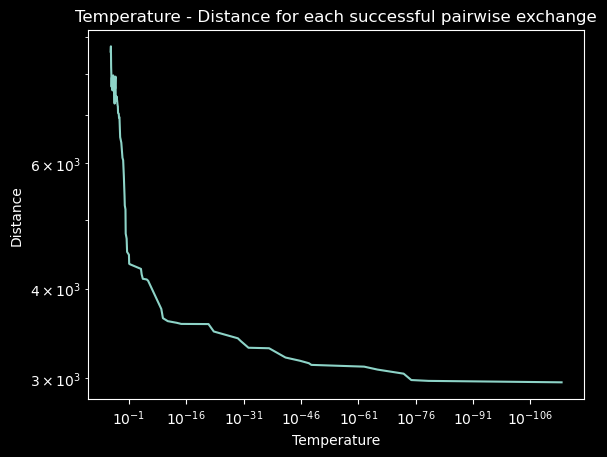

The local minimum distance obtained from this iteration for this path is 2957.508129820292.


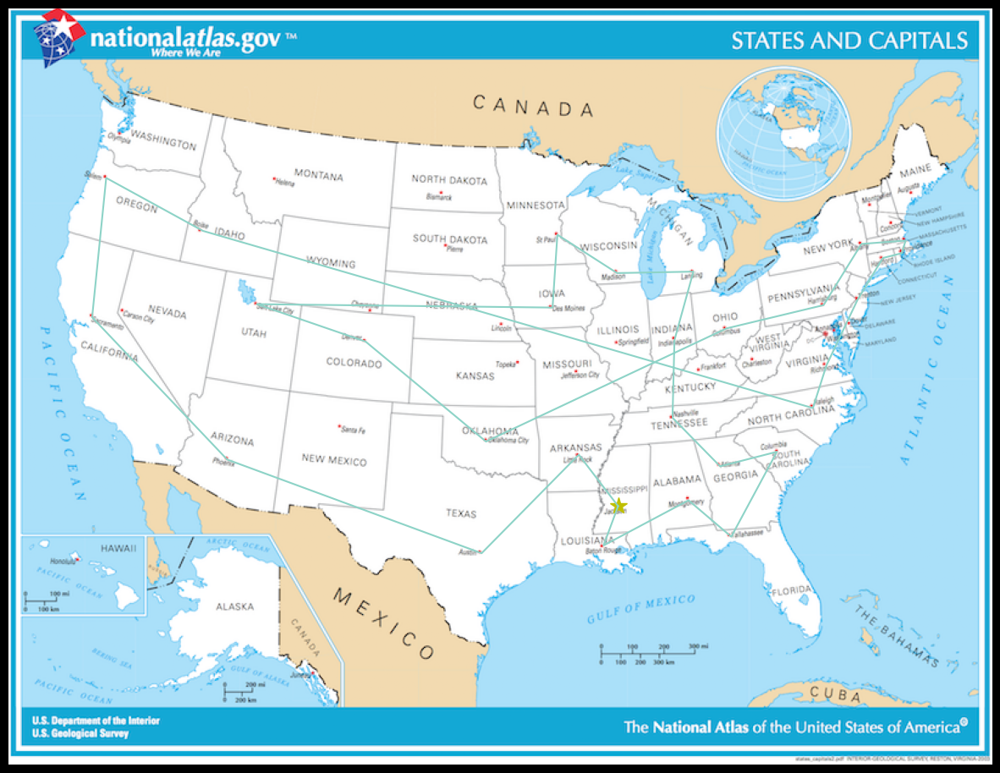

In [20]:
anneal(α = 0.87, T0 = 5560, N = 30, dt = 8400)
plot()
show_path(path,path[0])

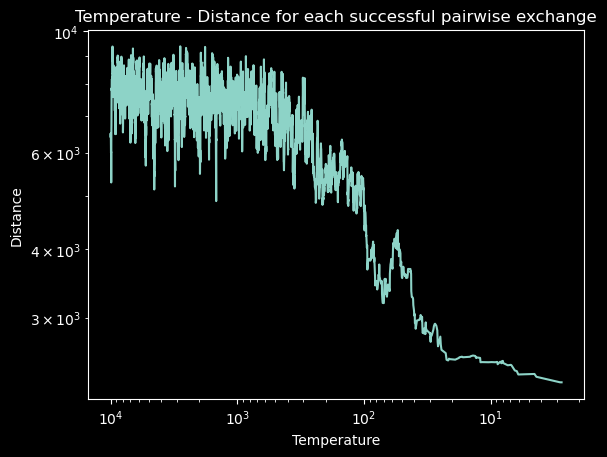

The local minimum distance obtained from this iteration for this path is 2285.5910846063603.


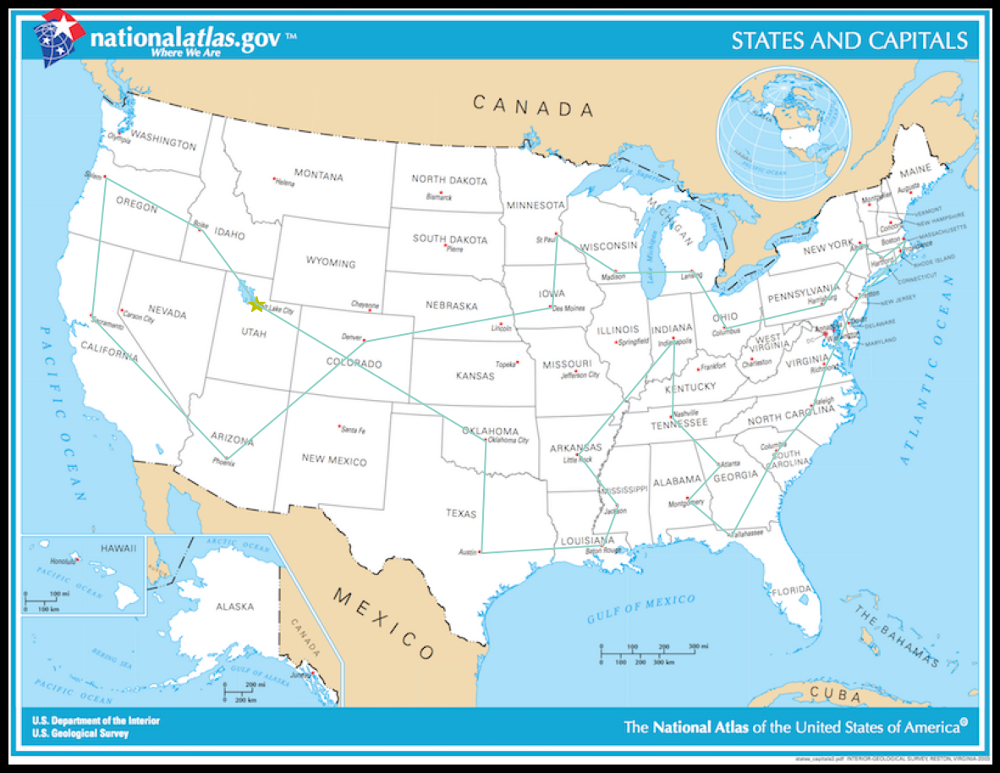

In [21]:
anneal(α = 0.999, T0 = 10000, N = 30, dt = 8500)
plot()
show_path(path,path[0])

## The Search for the Global Minima:

Now, it is time to find the optimal minimum path. Since the Annealing Algorithm uses probabilistic methods, we shall get different values for the minimum distance each time the algorithm is performed. So in order to find the optimal minimum-path, the algorithm should be run many times and the distances stored. The optimal path for these will be the lowest value within the array of stored distances.

Below, we define a function for this process.

In [22]:
def optimal(α, T0, N, dt, x): # x is number of run times
    d = [] # best distances
    opt_path = [] # optimal path
    paths = [] # store all final paths for each iteration
    
    # need to repeat the annealing for the same path, not use a different random path each time. 
    for i in range(x): # number of repetitions
        anneal(α, T0, N, dt)
        d.append(D[-1]) # append final distance for each iteration
        paths.append(path) # append final path for each iteration

    d_min = min(d) # minimum distance calculated
    d_min_index = d.index(d_min) # index of the min distance in the array
    opt_path = paths[d_min_index] # opt_path has same index as d_min

    show_path(opt_path, opt_path[0]) # show optimal path overlayed on map.jpg
    print('The optimal path for {0} cities and {1} runs is: {2}'.format(N, x, d_min))

## Optimal Path
Now we'll run the 'optimal' function with defined parameters for all the cities in `capitals_list`:

C:\Users\ellio\AppData\Local\Temp\ipykernel_11440\553918473.py:22: RuntimeWarning: overflow encountered in exp
  P = np.exp(-(d_new - d_old)/T) # arms the exponential probability function


The optimal path for 30 cities and 30 runs is: 2286.2795843841654


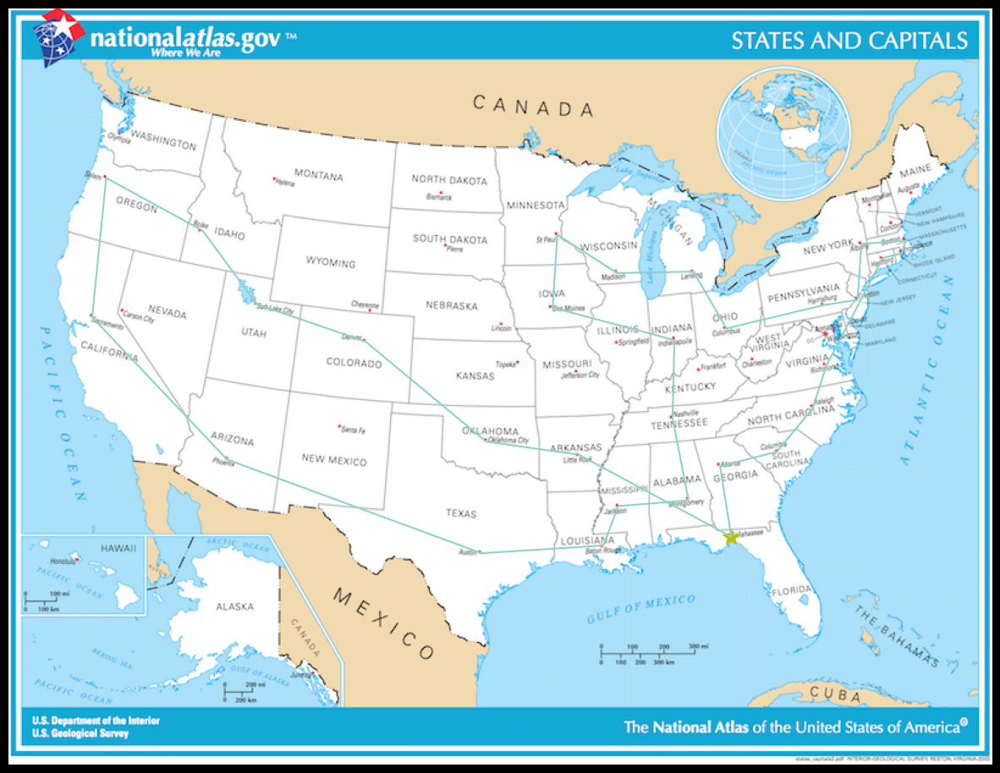

In [23]:
optimal(0.93, 4200, 30, 7700 , 30)
# current run time ~ 20 seconds

Despite running the algorithm many times and finding the lowest result of all of these runs, it still may be a local minimum rather than a global minimum. There  is a high probability that the so-called 'optimal' parameters we use for the annealing algorithm aren't the best.

It is possible that there are many local minima surrounding the global minima and therefore to obtain it, we could a similar thing to finding the optimal distance. We could run the "optimal" function we have defined for each parameter, whilst varying such parameters. We could create arrays with values that are linearly spaced for each parameter and use 'for' loops in order to run through these values, whilst storing the path length outputs. Then find the minimum value for each of these parameters.

We could also run all of these paramater variations at the same time. However if we have, say, 3 nested `for` loops and the linearly spaced arrays (linspace) we define have 30 indices, then the computer will need to run through $30 \choose 3$ variations, which will take a lot of time. Combining this with running the algorithm several times to ensure that the true optimal path is found, this will result in an unnecessarily long run time, given the simplicity of the model we are using in this report.

Due to the stochastic nature of the algorithm, and the number of local minima that there must be surrounding the global minima, the need to optimise the input parameters is vital. The lowest 'optimal' solution for the Travelling Salesperson that I have found using the Simulated Annealing Algorithm is shown below:

<div> <img src="optimal-annealing.png"  style="width: 800px;height:150px"/></div>

It is understood that the Global Minimum is very unlikely to be found every single time, due to the probabilistic nature of the problem, but finding the optimal set of parameters is likely to provide us with a local minima that is close.

#### Finding the Longest Path:

If wanted to find the longest path instead of the shortest, then we could alter the algorithm in such a way that the Pairwise Exchange should be generally rejected (with a few exceptions due to the nature of the probability function  [Equation (2)] and the Temperature Schedule [Equation (3)])if $d_{new} > d_{old}$ , such that  $d_{new} - d_{old} > 0$ . Therefore the new equation for the Probability Distribution we use is:

$$ P = e^{ \left( d_{new} - d_{old}  \right) / T } \tag4 $$

Where the parameters within the equation are the same as previously defined.
However, we could instead change the 'anneal' function and accept the pairwise exchange if P < random generated number and obtain the same result.

In [24]:
def longest(α, T0, N, dt):

    # initialise the variables
    global D, path, Temps
    D = []
    Temps = []
    
    path = random_path(N) # generate random path for 'N' cities

    for i in range(dt): # 0-199 ; 200 iterations in total
        T = temp(T0, α, i) # temperature schedule
        rd_num = rd.uniform(0,1) # uniform distribution to obtain a random number
        
        d_old = length(path)
        
        newpath = pairwise(path.copy()) # new path is constructed from a pairwise exchange of a copy of the current path
        d_new = length(newpath)
        
        P = np.exp((d_new - d_old)/T)
        
        if P > rd_num:
            path = newpath
            Temps.append(T)
            D.append(d_new)

C:\Users\ellio\AppData\Local\Temp\ipykernel_11440\1514610024.py:19: RuntimeWarning: overflow encountered in exp
  P = np.exp((d_new - d_old)/T)
C:\Users\ellio\AppData\Local\Temp\ipykernel_11440\1514610024.py:19: RuntimeWarning: overflow encountered in scalar divide
  P = np.exp((d_new - d_old)/T)
C:\Users\ellio\AppData\Local\Temp\ipykernel_11440\1514610024.py:19: RuntimeWarning: divide by zero encountered in scalar divide
  P = np.exp((d_new - d_old)/T)


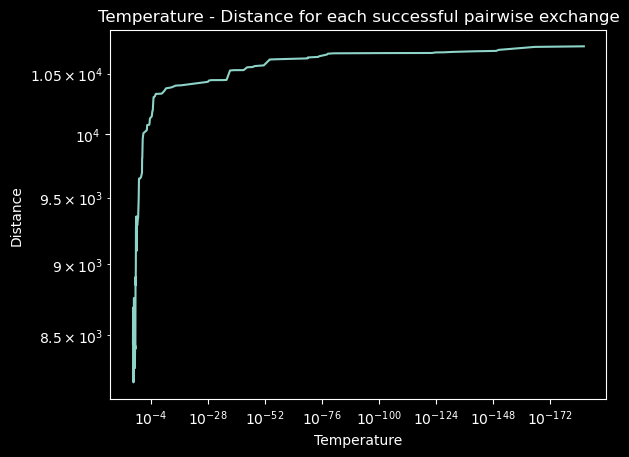

The local minimum distance obtained from this iteration for this path is 10735.990065815842.


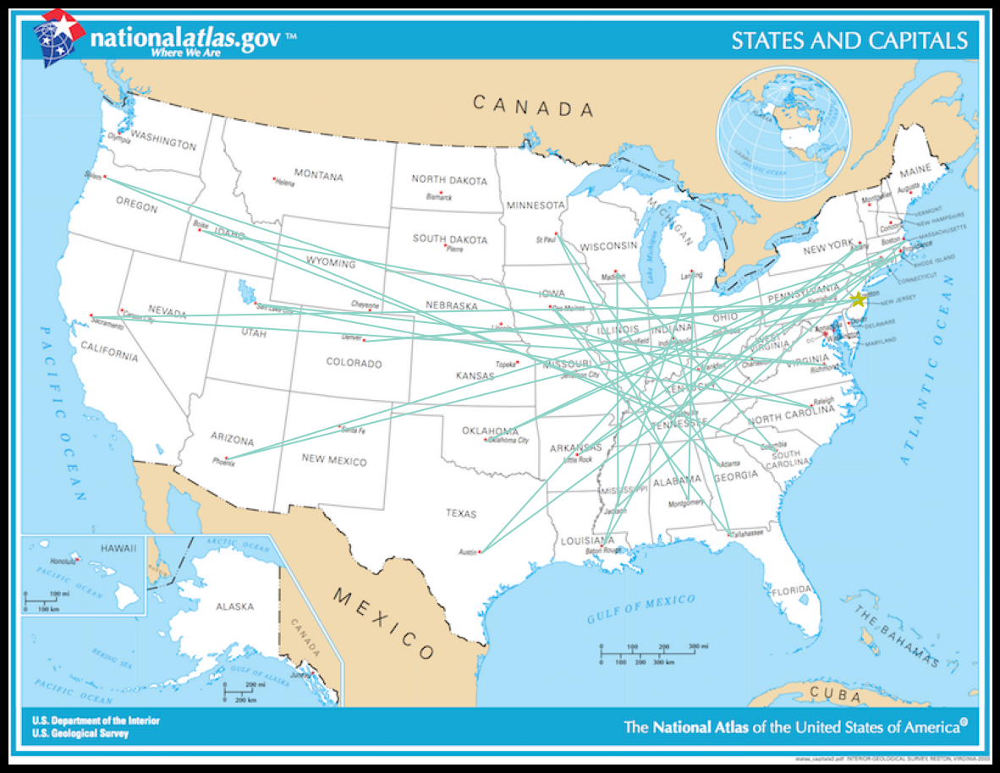

In [25]:
longest(0.87, 4000, 30, 7700)
plot()
show_path(path,path[0])

### Real-world applications of Simulated Annealing:

Simulated annealing is an approximation technique that can be used within artificial intelligence, for example Deep Learning or optimising a structure of a Neural Network. Since a Neural Network is comprised of nodes and weighted edges, it would make sense to try and adapt the use of a type of TSP in order to optimise the Neural Network. In theory the fewer paths between nodes in a Neural Network, the more efficient the algorithm would work and thus the Neural Network shall be considered optimised (Kuo et al., 2022).

### Limitations of the Simulated Annealing Algorithm:
Given that the whole Annealing algorithm is based on probability and is stochastic, there will always be some limitations to its success, efficiency and accuracy.

For example if the value for $\alpha$ is too low, then the rate of change of the Temperature Schedule will increase, and this could result in a convergence at a local minima. However if $\alpha$ is too high, then the rate of change of temperature would decrease; potentially resulting in an inconvenient amount of time for the algorithm to take place.

Another example of a limitation to this method would be that the distance calculated via Pythagoras' Theroem does not factor in the physical properties of the path between cities. For example, there may be a detour away from the direct path due to the curvature of roads etc. Furthermore, one could suggest that gradients of the roads should be taken into account in order to maximise vehicles miles-per-gallon and fuel usage.
In order to combat this, we could do another pairwise exchange for all the permutations of routes between two consecutive cities, like 'nested' TSP's.

---

## Example 2 : The Tacoma Bridge

#### Defining the Model:
In this report we shall model the Tacoma Bridge disaster as a suspended roadway using a cross section of the bridge at eye level, as if one were travelling across the bridge - as shown in Figure 2.


<div> <img src="tacoma bridge.jpg"  style="width: 400px;height:300px"/></div>
$$ \text{Figure 2: A diagram of the cross-section of the model of the Tacoma Narrows Bridge}$$

$\theta$ is the torsion angle, $y$ is the vertical displacement and the length of the bridge (width in this model) is $2l$.

If we were to define the cables as springs, then the tension force that the springs undergo with spring constant 'K' and distance 'y' would be $ f(y) = -Kx$. However, it is important to note that the cables in this model are not springs. Instead they are taut when extended but resist upon compression. If we treated the cables like springs, this could result in more oscillations and the vertical displacement (amplitude) of the bridge would be greater, causing more stress on the structure and potentially leading to a quicker mechanical failure.

Using cables in this model along with no damping or external forces gives a modified version of Hooke's equation for Tension Force - known as the McKenna-Tuama Modification (McKenna & Tuama, 2001). We notice that for small y-values, $ f(y) \simeq Ky $ which is an approximation for Hooke's Law - as seen in Equation (11) below:

$$ f(y) = \frac{K}{a}(e^{ay}-1) \tag{11} $$

Now introducing the set of coupled differential equations and the variables that we'll use to represent the behaviour and oscillations of the Tacoma Narrows Bridge. In order to obtain the following equations, find the resultant force in the y-direction from the weight of the rod and the tension force applied via the McKenna-Tuama modification (remembering that our model only focuses on motion occuring in the y-direction), along with calculating the Moment of Inertia of a rod to calculate the moment of inertia of the Bridge to obtain:

$$ \frac{d^2y}{dt^2} = -d \times \frac{dy}{dt} - \frac{K}{ma}(e^{a(y-l\sin(\theta))} + e^{a(y+l\sin(\theta))} -2) \tag{11}$$

$$ \frac{d^2\theta}{dt^2} = -d \times \frac{d\theta}{dt} + \frac{3\cos{\theta}}{l}\frac{K}{ma}(e^{a(y-l\sin(\theta))} - e^{a(y+l\sin(\theta)}) \tag{12}$$

where $d$ is the dissipative constant / friction coefficient.

From there, we assign new variables (Equation (13) and (14)) to the first-order derivatives of the second-order differential equations above (Equation (11) and (12)) to obtain two first order differential equations [(15) and (16)]:
$$ \frac{dy}{dt} = z \tag{13}$$

$$ \frac{d\theta}{dt} = \gamma \tag{14}$$

$$ \frac{dz}{dt} = -d \times z - \frac{K}{ma}(e^{a(y-l\sin(\theta))} + e^{a(y+l\sin(\theta))} -2) \tag{15}$$

$$ \frac{d\gamma}{dt} = -d \times \gamma + \frac{3\cos{\theta}}{l}\frac{K}{ma}(e^{a(y-l\sin(\theta))} - e^{a(y+l\sin(\theta)}) \tag{16}$$

This formulation is important since the Cromer method can only be used for first-order differential equations.

### Taylor and Cromer Methods:

An Explicit Method for solving differential equations uses the current state of the system to calculate the state of the system at a later time, therefore no algebraic equations need to be solved (Sloane, nd.) - in this case it will be the Taylor Method. A Semi-Explicit method for solving differential equations uses an aspect of the next state of the system (along with the current state of the system) in order to obtain the next state of the system; therefore some algebraic equations must be solved - for this investigation it will be the Cromer Method. Below, are the proposed Taylor and Cromer methods for approximation of differential equations (Saroja & Nuriyah, 2019):

$$ \text{Cromer Method}$$

$$ \theta_{n+1} = \theta_n + dt \cdot \gamma_{n+1} \tag{5} $$
$$ y_{n+1} = y_n + dt \cdot  z_{n+1} \tag{6} $$

$$ \text{Taylor Method}$$

$$ \theta_{n+1} = \theta_n + dt \cdot \gamma_{n} \tag{7} $$
$$ y_{n+1} = y_n + dt \cdot  z_{n} \tag {8} $$

Given the nature of the Cromer and Taylor Methods, where small timesteps are used, the first order derivatives shall have constant values. Hence, they shall remain the same for both Taylor and Cromer methods.

$$ \text{Both Methods} $$

$$ \frac{dy_{n+1}}{dx} = \frac{dy_{n}}{dx} + dt \cdot \frac{d^2y_{n}}{dx^2} \tag9$$

$$ \frac{d\theta_{n+1}}{dt} = \frac{d\theta_{n}}{dt} + dt \cdot \frac{d^2\theta_{n}}{dt^2} \tag{10} $$


Due to limitation of computational accuracy, implying a numerical error, we must use small timesteps - especially when using the Taylor Method. This error will accumulate over time and increase the overall deviation. Since the next state of the system using Taylor Method is entirely dependent on the current state, there is a much higher risk of the next calculated state of the system having a large deviation from the expected next-state. 

Next, we shall assess the advantages and disadvantages of using the Taylor or Cromer method of approximation:

##### Advantages of the Cromer Method:

- The Cromer method is more stable than the Taylor method for certain types of differential equations, such as those with discontinuities or sharp changes in the derivative.
- The Cromer method involves only the calculation of first-order derivatives, therefore it's generally a faster process than the Taylor Method.

##### Advantages of the Taylor Method:
- Includes higher order derivatives in the differential equations for the approximation, therefore it could be deemed as a more accurate approximation.

##### Disadvantages of the Cromer Method:

- The Cromer method is generally less accurate than the Taylor method, as it uses lower-order derivative terms in the  differential equation for the appproximations.

##### Disadvantages of the Taylor Method:

- Given that it requires the calculation of higher-order derivatives, it can result in a long run-time.
- In order to calculate the next state of the system, it solely relies information on the current state of the system; hence any level of uncertainty will give either systematic or random error (if there is low rounding) and hence could lead to a large deviation in the system of results.

Overall, the more favoured approximation method for this model could the Cromer Method since it is faster than the Taylor method and more accurate for large values of $dt$.

#### Initialising the Variables:

In [26]:
tstart=0 # start time
tend=100 # end time

d=0.01 # dissipative constant / friction coeffiient
a=0.1 # force parameter
M=2500 # mass of beam
K=1000 # spring constant
l=12

# omega = 2π/2 ~ 3

#### Defining the Pendulum Function:

To define this function, it is necessary to consider the different numerical methods to solve differential equations. In this case we shall consider the Taylor and Cromer Methods. The model we shall use is a rather simplistic cross-section of the bridge itself i.e., a uniform beam of mass $M$ with length $L$ (although its length is not important to this investigation) with cables suspending it at either end. We shall define $\theta(t)$ to be the angle between the equilibrium position of the 'bridge' [ $\theta(0)$ ] and its orientation at $\theta(t)$.

In [27]:
def pendulum(dt = 0.001, cromer = False, y0 = 0, theta0 = 0, gamma0 = 0, z0 = 0):

    # Create the variables to store the results
    times=np.arange(tstart, tend + dt, dt)  # Create the array of model times
    Nt=len(times)                         # Number of time-steps
    y=np.zeros(Nt)                   
    theta=np.zeros(Nt)                   
    z=np.zeros(Nt) 
    gamma=np.zeros(Nt)
    dz = np.zeros(Nt)
    dgamma = np.zeros(Nt)

    # Set the initial conditions
    y[0] = y0
    theta[0] = theta0
    z[0] = z0 # dy/dt
    gamma[0] = gamma0 #d(theta)/dt
    dz[0] = 0
    dgamma[0] = 0
    
    # Loop over all of the times and integrate the model
    for n in range(Nt-1):
        
        dz[n] = -d*z[n] - (K/(M*a)) * (np.exp(a*(y[n]-l*np.sin(theta[n]))) + np.exp(a*(y[n]+l*np.sin(theta[n])))-2)
        
        dgamma[n] = -d*gamma[n] + (3*np.cos(theta[n])/l) * (K/(M*a)) * (np.exp(a*(y[n]-l*np.sin(theta[n])))- np.exp(a*(y[n]+l*np.sin(theta[n]))))
        
        z[n+1] = z[n] + dt*(dz[n])
        
        gamma[n+1] = gamma[n] + dt*(dgamma[n])
        
        # Time-step the angle/vertical displacement. If we are using 'Taylor' or 'Cromer"
        
        if cromer: # Cromer method
            theta[n+1] = theta[n] + dt * gamma[n+1]
            y[n+1] = y[n] + dt * z[n+1]
        
        else: # Taylor method
            theta[n+1] = theta[n] + dt * gamma[n]
            y[n+1] = y[n] + dt * z[n]

    return times, theta, y # returning 3 arrays

##### Running the Algorithm for both methods of approximation:
Now we shall run the pendulum algorithm for both Cromer and Taylor Methods to compare the differences in their outputs.

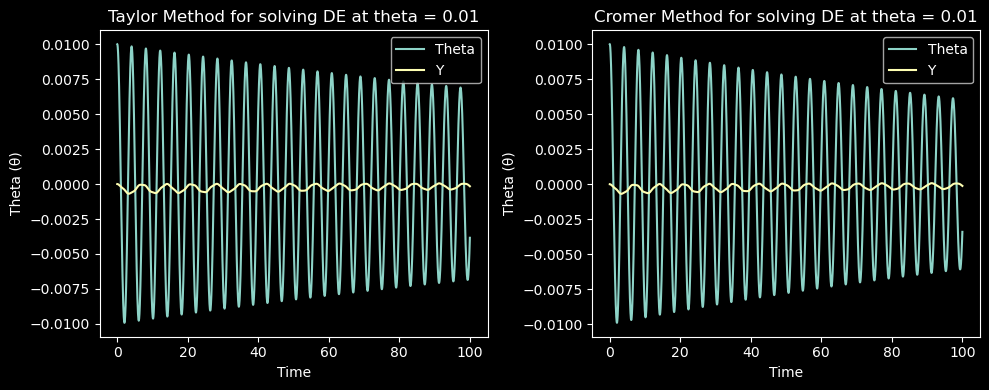

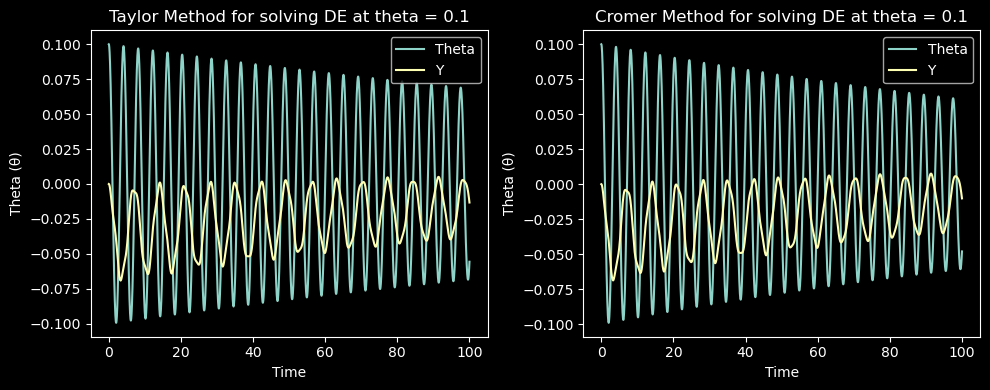

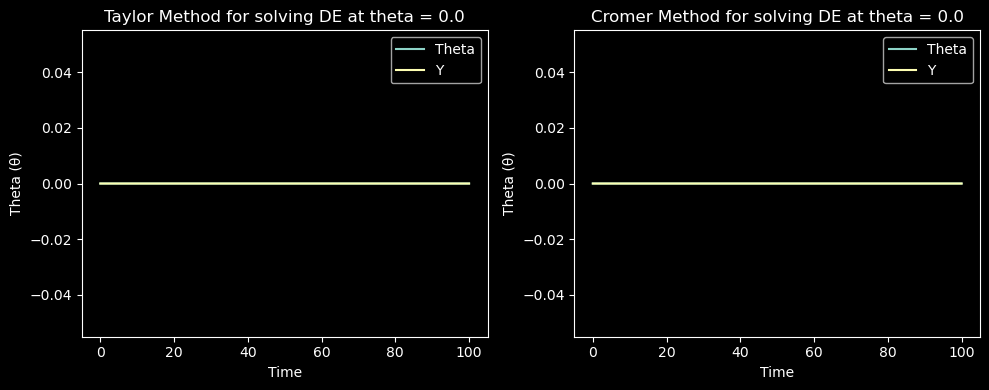

In [28]:
fig, (T1, T2) = plt.subplots(1,2, figsize=(10,4))

times, theta, y = pendulum(dt=0.001, cromer=False, y0 = 0, theta0 = 0.01, gamma0 = 0, z0 =0)
T1.plot(times, theta, label = 'Theta')
T1.plot(times, y, label = 'Y', linestyle = '-')
T1.legend()
T1.set_xlabel('Time')
T1.set_ylabel('Theta (θ)')
T1.set_title('Taylor Method for solving DE at theta = 0.01')

times, theta, y = pendulum(dt = 0.001, cromer=True, y0 = 0, theta0 =0.01, gamma0 = 0, z0 =0)
T2.plot(times, theta, label = 'Theta')
T2.plot(times, y, label = 'Y', linestyle = '-')
T2.legend()
T2.set_xlabel('Time')
T2.set_ylabel('Theta (θ)')
T2.set_title('Cromer Method for solving DE at theta = 0.01')

fig.tight_layout()

fig, (T3, T4) = plt.subplots(1,2, figsize=(10,4))

times, theta, y = pendulum(dt=0.001, cromer=False, y0 = 0, theta0 = 0.1, gamma0 = 0, z0 =0)
T3.plot(times, theta, label = 'Theta')
T3.plot(times, y, label = 'Y', linestyle = '-')
T3.legend()
T3.set_xlabel('Time')
T3.set_ylabel('Theta (θ)')
T3.set_title('Taylor Method for solving DE at theta = 0.1')

times, theta, y = pendulum(dt = 0.001, cromer=True, y0 = 0, theta0 =0.1, gamma0 = 0, z0 =0)
T4.plot(times, theta, label = 'Theta')
T4.plot(times, y, label = 'Y', linestyle = '-')
T4.legend()
T4.set_xlabel('Time')
T4.set_ylabel('Theta (θ)')
T4.set_title('Cromer Method for solving DE at theta = 0.1')

fig.tight_layout()

fig, (T5, T6) = plt.subplots(1,2, figsize=(10,4))

times, theta, y = pendulum(dt=0.001, cromer=False, y0 = 0, theta0 = 0.0, gamma0 = 0, z0 =0)
T5.plot(times, theta, label = 'Theta')
T5.plot(times, y, label = 'Y', linestyle = '-')
T5.legend()
T5.set_xlabel('Time')
T5.set_ylabel('Theta (θ)')
T5.set_title('Taylor Method for solving DE at theta = 0.0')

times, theta, y = pendulum(dt = 0.001, cromer=True, y0 = 0, theta0 =0.0, gamma0 = 0, z0 =0)
T6.plot(times, theta, label = 'Theta')
T6.plot(times, y, label = 'Y', linestyle = '-')
T6.legend()
T6.set_xlabel('Time')
T6.set_ylabel('Theta (θ)')
T6.set_title('Cromer Method for solving DE at theta = 0.0')

fig.tight_layout()
plt.show();

As we can see in the Figure above there is no real difference between the Taylor and Cromer methods, which is due to the size of $dt$ being really small. As aforementioned, the next state of the system is dependent on the current state therefore there is a high probability of the next state of the system having a large deviation from its expected state. A small value for $dt$ will result in smaller deviations for the next system state, hence reducing the uncertainty between the two adjacent system states.

The Figure above shows that both $\theta(t)$ and $y(t)$ are sinusoidal functions where the period of theta is 1.5 times that of Y, suggesting some form of anti-phase betwen the two variables. The amplitude of theta also decreases over time which suggests that the energy is dissipating from the system, as expected from an undriven oscillator.

For curiosity purposes we shall below look at the pendulum function for a larger $dt$.
If we were to use a larger value for $dt$, we would then be able to see the difference in effectiveness between the Taylor and Cromer method. For example below, we will use $dt = 0.1$ for Taylor and Cromer methods and compare them.

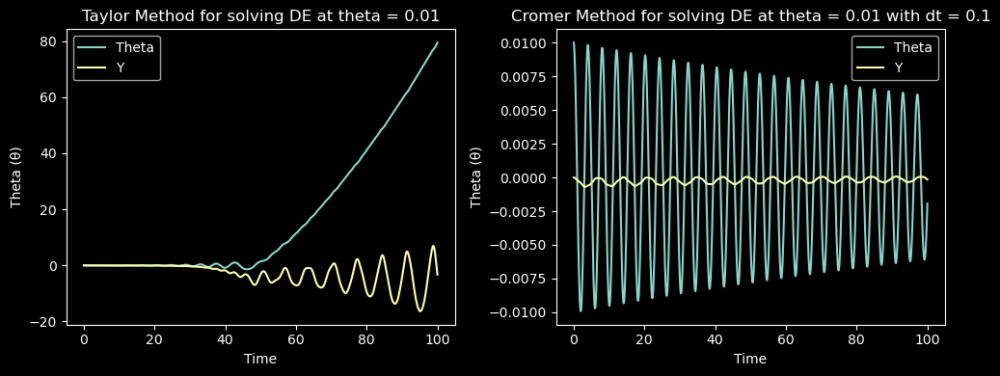

In [29]:
fig, (T1, T2) = plt.subplots(1,2, figsize=(10,4))

times, theta, y = pendulum(dt=0.1, cromer=False, y0 = 0, theta0 = 0.01, gamma0 = 0, z0 =0)
T1.plot(times, theta, label = 'Theta')
T1.plot(times, y, label = 'Y', linestyle = '-')
T1.legend()
T1.set_ylabel('Theta (θ)')
T1.set_xlabel('Time')
T1.set_title('Taylor Method for solving DE at theta = 0.01')

times, theta, y = pendulum(dt = 0.1, cromer=True, y0 = 0, theta0 =0.01, gamma0 = 0, z0 =0)
T2.plot(times, theta, label = 'Theta')
T2.plot(times, y, label = 'Y', linestyle = '-')
T2.legend()
T2.set_ylabel('Theta (θ)')
T2.set_xlabel('Time')
T2.set_title('Cromer Method for solving DE at theta = 0.01 with dt = 0.1')

plt.tight_layout()
plt.show();

The figure above shows that the Taylor method of approximation produces a less accurate results for the `time` and `theta` arrays in comparison to its Cromer method counterpart. Since the Cromer method produces a graph similar to ones of a smaller $dt$ for both the Taylor and Cromer method, we can deduce that the Taylor method doesn't provide reliable results for larger values of $dt$.

### Introducing a Driving Force:

Below we define a function that adds a driving force to our system. This driving force shall appear in the form of a wind force that is acting solely in the y-direction, i.e., there is no displacement in the x-direction. We model the wind force as follows:

$$ a(t) = \frac{F(t)}M = A \sin(\omega t) \tag{16}$$

Since the Wind Force function is a force that only acts in the y direction, so does its acceleration. Hence, we must edit one of the previously defined differential equations (Equation (15)) so that it becomes:

$$ \frac{dz}{dt} = -d \times z - \frac{K}{ma}(e^{a(y-l\sin(\theta))} + e^{a(y+l\sin(\theta))} -2) + A \sin(\omega t) \tag{17}$$

In [30]:
def tacoma_drive(dt=0.001, cromer=False, y0 = 0, theta0 = 0, gamma0 = 0, z0 =0, A = 1, omega = 3):


    # Create the variables to store the results
    global times, Nt
    times=np.arange(tstart, tend + dt, dt)  # Create the array of model times
    Nt=len(times)                         # Number of time-steps
    y=np.zeros(Nt)                   
    theta=np.zeros(Nt)                   
    z=np.zeros(Nt) 
    gamma=np.zeros(Nt)
    dz = np.zeros(Nt) # create 'zero' arrays for all extra variables.
    dgamma = np.zeros(Nt)

    # Set the initial conditions
    y[0] = y0
    theta[0] = theta0
    z[0] = z0 # dy/dt
    gamma[0] = gamma0 # d(theta)/dt
    dz[0] = 0
    dgamma[0] = 0
    
    # Loop over all of the times and integrate model
    
    for n in range(Nt-1):
        
        # add the wind force to dz
        dz[n] = -d*z[n] - (K/(M*a)) * (np.exp(a*(y[n]-l*np.sin(theta[n]))) + np.exp(a*(y[n]+l*np.sin(theta[n])))-2) + (A)*np.sin(omega*times[n])
        dgamma[n] = -d*gamma[n] + (3*np.cos(theta[n])/l) * (K/(M*a)) * (np.exp(a*(y[n]-l*np.sin(theta[n])))- np.exp(a*(y[n]+l*np.sin(theta[n]))))
        
        z[n+1] = z[n] + dt*(dz[n])
        gamma[n+1] = gamma[n] + dt*(dgamma[n])
        
        
        # Time-step the angle/vertical displacement for Taylor or Cromer method
        
        if cromer:
            theta[n+1] = theta[n] + dt*gamma[n+1]
            y[n+1] = y[n] + dt * z[n+1]
        
        else: # Taylor method
            theta[n+1] = theta[n] + dt * gamma[n]
            y[n+1] = y[n] + dt * z[n]
    return times, theta, y

We shall now look at the progression of $\theta$ over time for different values of A and for a constant value $\omega = 3$.

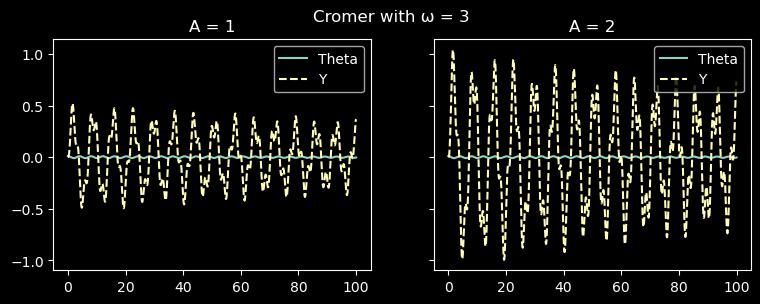

In [31]:
fig, (T1, T2) = plt.subplots(1,2, figsize=(9,3), sharey = True)

times, theta, y = tacoma_drive(dt=0.001, cromer =True, y0 = 0, theta0 = 0.01, gamma0 = 0, z0 =0, A = 1, omega = 3)
T1.plot(times, theta, label = 'Theta')
T1.plot(times, y, label = 'Y', linestyle = 'dashed')
T1.set_title('A = 1')
T1.legend()

times, theta, y = tacoma_drive(dt=0.001, cromer= True, y0 = 0, theta0 = 0.01, gamma0 = 0, z0 =0, A = 2, omega = 3)
T2.plot(times, theta, label = 'Theta')
T2.plot(times, y, label = 'Y', linestyle = 'dashed')
T2.set_title('A = 2')
T2.legend()

fig.suptitle('Cromer with ω = 3')

plt.show();

As we can see in Figure above, we observe that for both A = 1 and A = 2 (which is defined as a constant which represents the amplitude of the driving wind force), the y-values follow sinusoidal patterns through time, similar to that of a double pendulum. There are no observed differences in y values of these two plots except the amplitude of oscillations. One would expect that there be some variation or chaos present in the plot created via aeroelastic flutter - which would induce unstable, self-excited oscillations (Katz & Jose, 2017).

C:\Users\ellio\AppData\Local\Temp\ipykernel_11440\1031108218.py:18: MatplotlibDeprecationWarning: You have mixed positional and keyword arguments, some input may be discarded.  This is deprecated since 3.9 and will become an error in 3.11.
  fig.legend([T3,T4], labels=labels, loc = 'upper right')
C:\Users\ellio\AppData\Local\Temp\ipykernel_11440\1031108218.py:35: MatplotlibDeprecationWarning: You have mixed positional and keyword arguments, some input may be discarded.  This is deprecated since 3.9 and will become an error in 3.11.
  fig.legend([T3,T4], labels=labels, loc = 'upper right')


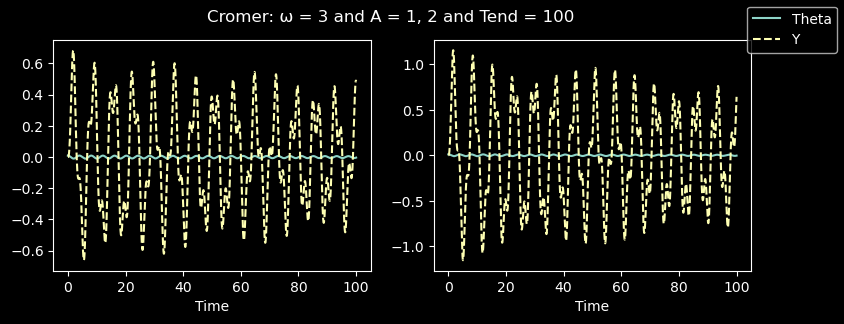

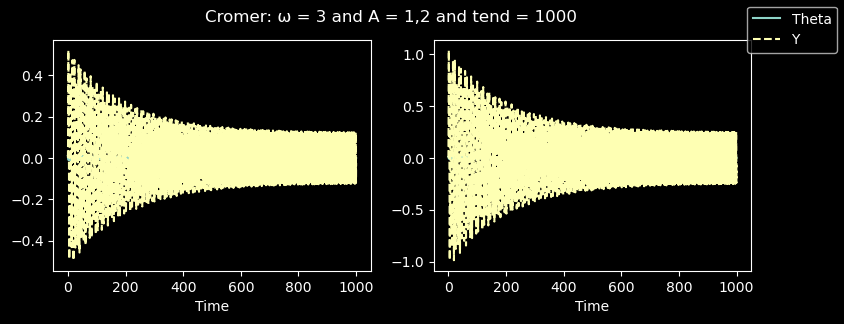

In [32]:
labels = ['Theta','Y']

fig, (T1, T2) = plt.subplots(1,2, figsize=(9,3))
fig.suptitle('Cromer: ω = 3 and A = 1, 2 and Tend = 100')

tend = 100

times, theta, y = tacoma_drive(dt=0.001, cromer=True, y0 = 0, theta0 = 0.01, gamma0 = 0, z0 =0, A = 1, omega = 2.5)
T1.plot(times, theta)
T1.plot(times, y, linestyle = 'dashed')
T1.set_xlabel('Time')

times, theta, y = tacoma_drive(dt=0.001, cromer= True, y0 = 0, theta0 = 0.01, gamma0 = 0, z0 =0, A = 2, omega = 2.8)
T2.plot(times, theta)
T2.plot(times, y, linestyle = 'dashed')
T2.set_xlabel('Time')

fig.legend([T3,T4], labels=labels, loc = 'upper right')

tend = 1000 # change the end time

fig, (T3,T4) = plt.subplots(1,2, figsize=(9,3))
fig.suptitle('Cromer: ω = 3 and A = 1,2 and tend = 1000')

times, theta, y = tacoma_drive(dt=0.001, cromer=True, y0 = 0, theta0 = 0.01, gamma0 = 0, z0 =0, A = 1, omega = 3)
T3.plot(times, theta)
T3.plot(times, y, linestyle = 'dashed')
T3.set_xlabel('Time')

times, theta, y = tacoma_drive(dt=0.1, cromer=True, y0 = 0, theta0 = 0.01, gamma0 = 0, z0 =0, A = 2, omega = 3)
T4.plot(times, theta)
T4.plot(times, y, linestyle = 'dashed')
T4.set_xlabel('Time')

fig.legend([T3,T4], labels=labels, loc = 'upper right')

plt.show();

The figure for tend = 100 above shows a psuedo-chaotic nature for $y(t)$ since upon closer inspection, the periodic behaviour of $Y$ is the same for both amplitudes. Looking at the graphs for whih tend = 1000 we can clearly see that the sinusoidal nature of $Y$ is still present but the amplitude decreases, similar to that of an undriven harmonic oscillator, as time progresses, making the system more stable - providing us with the steady-state solution of the differential equations that comprise our model (Cline, 2021).

#### Plotting the time trajectories:
We shall now run the driven Tacoma function in order to obtain value arrays for $y$ and $\theta$, performing a function that returns the Time Trajectories ( $\theta$ against $y$) for a varying $\omega$. We shall create an array of linearly spaced values for $\omega \in [2,4)$ with increments of 0.2. We shall then go on to search for the `resonant frequency` by plotting Time Trajectories for values of $\omega$ from around 0 to the $\omega$ value that gives the highest amplitude of oscillation.

Note that, earlier, it was mentioned that an object can have multiple resonant frequencies dependent on the number of degrees of freedom it has. Hence, one can predict that there may be multiple instances of high amplitude oscillation visible when plotting these Time Trajectories. However, the frequency that we shall take as the 'natural' or resonant frequency is one that has the largest value for the amplitude of oscillation.

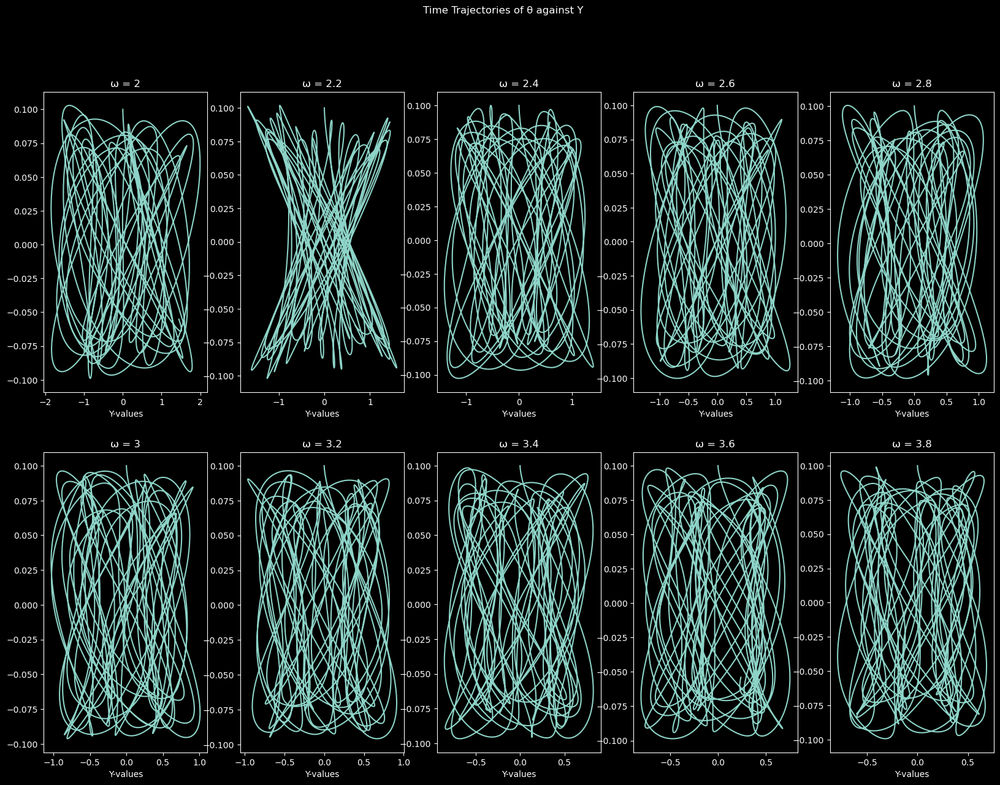

In [33]:
ω = np.arange(2,4,0.2) # this gives an array of values from 2 to 4 which have increments of 0.25

tstart = 0 # resetting the time values from the previous graphs
tend = 100 

fig, ax = plt.subplots(nrows = 2, ncols = 5, figsize = (20,14)) # creates 
fig.suptitle('Time Trajectories of θ against Y')

the = [] # create empty arrays for theta arrays
ys = [] # empty array for y arrays

for i in ω: # iterate the driven D.E  for each value of ω in linspace
    times, theta, y = tacoma_drive(dt = 0.001, cromer=False, y0 = 0, theta0 = 0.1, gamma0 = 0, z0 =0, A = 2, omega = i)
    the.append(theta)
    ys.append(y)

ax[0, 0].plot(ys[0], the[0])
ax[0, 0].set_title('ω = 2')
ax[0, 0].set_xlabel('Y-values')


ax[0, 1].plot(ys[1], the[1])
ax[0, 1].set_title('ω = 2.2')
ax[0, 1].set_xlabel('Y-values')


ax[0, 2].plot(ys[2], the[2])
ax[0, 2].set_title('ω = 2.4')
ax[0, 2].set_xlabel('Y-values')

ax[0, 3].plot(ys[3], the[3])
ax[0, 3].set_title('ω = 2.6')
ax[0, 3].set_xlabel('Y-values')

ax[0, 4].plot(ys[4], the[4])
ax[0, 4].set_title('ω = 2.8')
ax[0, 4].set_xlabel('Y-values')

ax[1, 0].plot(ys[5], the[5])
ax[1, 0].set_title('ω = 3')
ax[1, 0].set_xlabel('Y-values')

ax[1, 1].plot(ys[6], the[6])
ax[1, 1].set_title('ω = 3.2')
ax[1, 1].set_xlabel('Y-values')

ax[1, 2].plot(ys[7], the[7])
ax[1, 2].set_title('ω = 3.4')
ax[1, 2].set_xlabel('Y-values')

ax[1, 3].plot(ys[8], the[8])
ax[1, 3].set_title('ω = 3.6')
ax[1, 4].set_xlabel('Y-values')

ax[1, 4].plot(ys[9], the[9])
ax[1, 4].set_title('ω = 3.8')
ax[1, 4].set_xlabel('Y-values')

plt.show();

Above, we can see that the function for $\omega = 2.2$ is different than the general pattern for other values of omega.

One interpretation of this result is that it could be a partial resonance, and that $\omega = 2.2$ could correspond to another resonant frequency of the bridge i.e., a harmonic (due to the bridge's number of degrees of freedom), except at some time $t$ when the force's sinusoidal motion shall be cause it to be out of phase with the motion of the bridge and will be pushing the opposite way.

Overall, the Time Trajectory plots shows the chaotic relationship between $\theta$ and $y$ and upon inspection it seems that main use for these graphs is to identify a resonant frequency of the model.

We shall instead plot the time trajectories between $\omega = 0.4 $  (arbitrarily) and $\omega = 2.4$ to try and identify a resonant frequency, as shown below:

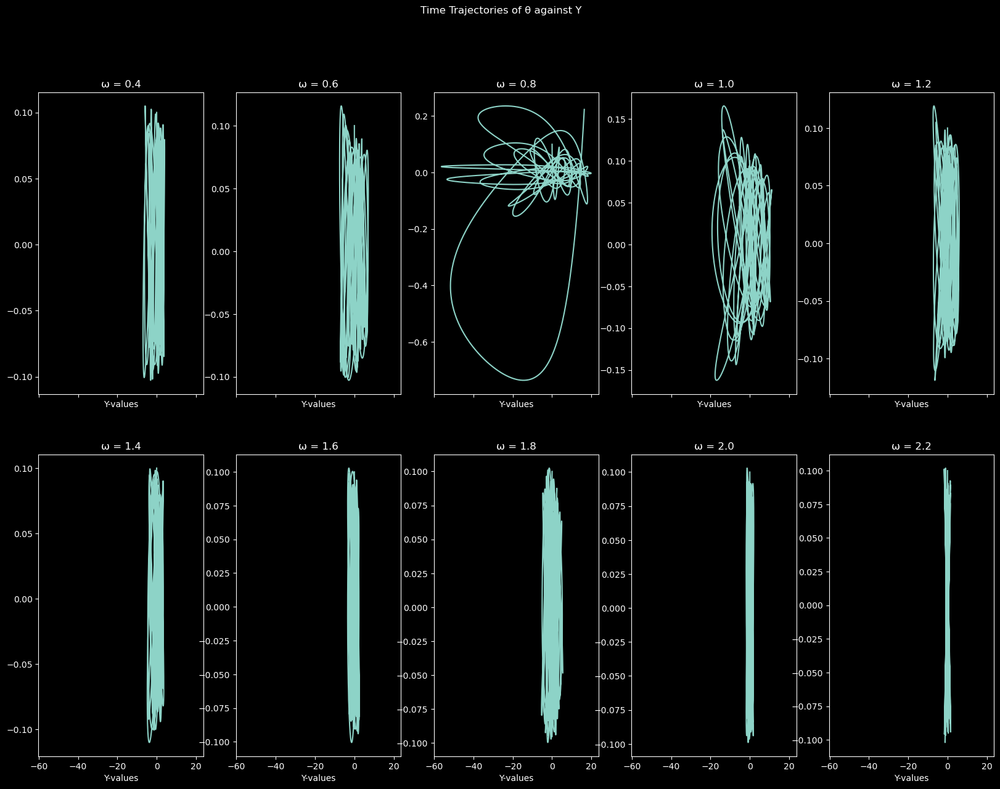

In [34]:
ω = np.arange(0.4,2.4,0.2) # this gives an array of values from 2 to 4 which have increments of 0.25

fig, ax = plt.subplots(nrows = 2, ncols = 5, figsize = (20,14), sharex = True)
fig.suptitle('Time Trajectories of θ against Y')

the = []
ys = []

for i in ω:
    times, theta, y = tacoma_drive(dt = 0.001, cromer=False, y0 = 0, theta0 = 0.1, gamma0 = 0, z0 =0, A = 2, omega = i)
    the.append(theta)
    ys.append(y)

ax[0, 0].plot(ys[0], the[0])
ax[0, 0].set_title('ω = 0.4')
ax[0, 0].set_xlabel('Y-values')

ax[0, 1].plot(ys[1], the[1])
ax[0, 1].set_title('ω = 0.6')
ax[0, 1].set_xlabel('Y-values')

ax[0, 2].plot(ys[2], the[2])
ax[0, 2].set_title('ω = 0.8')
ax[0, 2].set_xlabel('Y-values')

ax[0, 3].plot(ys[3], the[3])
ax[0, 3].set_title('ω = 1.0')
ax[0, 3].set_xlabel('Y-values')

ax[0, 4].plot(ys[4], the[4])
ax[0, 4].set_title('ω = 1.2')
ax[0, 4].set_xlabel('Y-values')

ax[1, 0].plot(ys[5], the[5])
ax[1, 0].set_title('ω = 1.4')
ax[1, 0].set_xlabel('Y-values')

ax[1, 1].plot(ys[6], the[6])
ax[1, 1].set_title('ω = 1.6')
ax[1, 1].set_xlabel('Y-values')

ax[1, 2].plot(ys[7], the[7])
ax[1, 2].set_title('ω = 1.8')
ax[1, 2].set_xlabel('Y-values')

ax[1, 3].plot(ys[8], the[8])
ax[1, 3].set_title('ω = 2.0')
ax[1, 4].set_xlabel('Y-values')

ax[1, 4].plot(ys[9], the[9])
ax[1, 4].set_title('ω = 2.2')
ax[1, 4].set_xlabel('Y-values')

plt.show();

Above we have made the graphs in the figure above share the same x-axis in order to try and identify the frequency ($\omega$) with the largest amplitude. Clearly there are two graphs that are of interest here: $\omega = 0.8,1.0 $. Therefore it is reasonable to say that the resonant frequency of our model of the Tacoma Bridge is between these two values. One could argue based on observation alone that since the graph showing $\omega = 0.8$ is clearly more erratic than the other in question - and shows a larger maximum amplitude - the resonant frequency is closer to $\omega = 0.8$ than $\omega = 1.0$.

### Heat Map
We will now define a function to show a 3-D Heat Map that corresponds to showing time and frequency $\omega$ on the x and y-axis respectively, whilst showing the torsional frequency $\theta$ on the z-axis and as the colour scheme. This Heat Map could also allow us to identify a resonant frequency within the data. For this, we shall plot 
`NOTE`: the following code structure has been drafted from Matplotlib's website (Matplotlib, 2002).

In [35]:
def heatmap(dt, cromer, y0, theta0, gamma0, z0, A):
    
    times = np.arange(tstart, tend + dt, dt)
    
    omega = np.linspace(0.5, 1.5, 10)
    
    thetas = []
    
    for i in omega:
        theta =  tacoma_drive(dt, cromer, y0, theta0, gamma0, z0, A, omega = i)[1]
        thetas.append(theta)
    
    fig, ax = plt.subplots(subplot_kw={"projection": "3d"})
        
    xtime = times # x
    yfreq = omega # y
    X, Y = np.meshgrid(xtime, yfreq)
    Z = np.array(thetas).reshape(len(yfreq),len(xtime))
    
    surface = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False) # define the surface and the colour scheme

    # z- the z axis limits
    ax.set_zlim(-0.5, 0.50)
    ax.zaxis.set_major_locator(LinearLocator(10))
    
    # A StrMethodFormatter is used automatically
    ax.zaxis.set_major_formatter('{x:.02f}')
    
    # Label axes
    plt.xlabel('Time')
    plt.ylabel('Frequency (ω)')
    ax.set_zlabel('Torsional Angle (θ)')
    
    # Add a color bar which maps values to colors.
    fig.colorbar(surface, shrink=0.5, aspect=5, location = 'left')
    fig.tight_layout()
    plt.show();

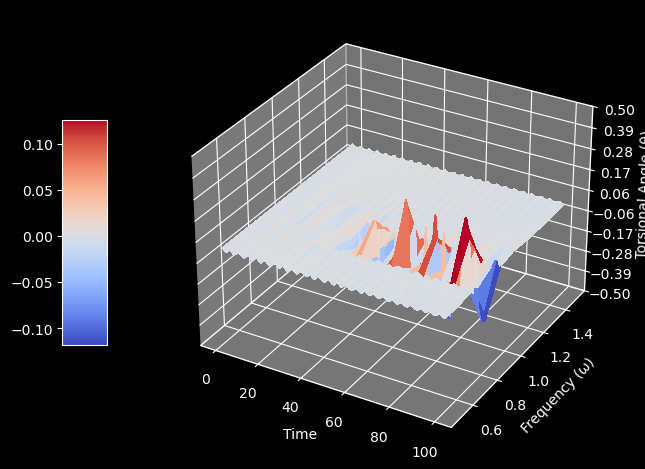

In [36]:
heatmap(dt=0.001, cromer=True, y0 = 0, theta0 = 0.01, gamma0 = 0, z0 =0, A = 1.5)

The figure above shows the relationship between Time and Frequency on the X and Y axes respectively and the torsional angle $\theta$ on the z-axis, which is also the purpose of the colour mapping on the z-axis. The graph shows that the largest torsional angle falls between $\omega = 1 $ and $\omega = 1.2$. Recall that at resonance the amplitude of oscillation is the greatest and so (in accordance with Equation [16]), this is also when the torisonal angle ($\omega$) is at its largest. Hence, we can assume that resonance in this driven system occurs between $\omega = 1 $ and $\omega = 1.2$. Converting these values for $\omega$ to a frequency in Hz using

$$ \omega = 2\pi\nu \tag{18} $$

we obtain that the range of values for the resonant / 'natural' frequency of the Tacoma Bridge in this model is:

$$ \frac{0.8}{2\pi}\text{Hz} \le \nu \le \frac{1}{2\pi}\text{Hz} \tag{19} $$  or $$ 0.13\text{Hz} \le \nu \le 0.16\text{Hz} \tag{20} $$

## Conclusion

In conclusion, we have successfully created a function that employs the simulated annealing algorithm and can produce a global minimum. We understand that since the function is probabilistic, it may not be able to produce the Global minimum for every time the `optimal` algorithm is run. However, we have chosen a set of optimal parameters such that a global minimum can be found. The shortest path distance found within this report for 30 cities in `capitals_list` was 2182.34. Due to the stochastic nature of the algorithm it is still sub-optimal since it doesn't return the global minimum each time. So within future uses of this algorithm, I would suggest that a new function be defined which takes the input parameters and runs the annealing algorithm for each of them, incorporating nested 'for' loops within this function; calculating the smallest path length for each variable and storing the 'optimal' value for each variable. However given the number of degrees of freedom that this function would have, it would be quite computationally expensive. Overall, this report has approached the TSP numerically by converting an np-hard problem into a problem that can be solved in polynomial time via a Monte Carlo method of sampling and approximation. 
In order to retain simplicity, this report focused on the symmetric TSP model. However, the asymmetric TSP could be deemed more appropriate and useful in real-life applications. For example, if there are one-way streets or road closures etc., that deem it not possible or sub-optimal to complete the Hamiltonian cycle via the original route or there is a 'shortcut' road between two nodes in a certain direction, then it's useful to consider the formulation of an asymmetric TSP. 

Despite obtaining a resonant frequency value that is close to the cited value for the Tacoma Narrows Bridge ($\nu = 0.2 $ Hz) (Enrera, 2022), our model doesn't account for any 3-dimensional motion that occurred during this event. Our model is 2-dimensional and simplistic in comparison to Tacoma Bridge Collapse. The simplistic model influences the readers' of this report to assume that resonance was the cause of the bridges collapse, after all resonance shall induce maximum stress on an object, making it more susceptible for material failure. However since our model was 2D, we forget about the structure of the bridge in 3D and the other phenomena that were present, right before its collapse. For example, the structure of the cables on the bridge and/or support beams weren't taken into account and so could affect the bridge's motion. Also the materials used for the bridge weren't a part of our model, therefore there could be increased stress and strain due to the torsional motion, inducing a mechanical failure in the bridge, causing it to collapse. The cited main cause for the Bridge's collapse was aeroelastic flutter, which wasn't accounted for in this model. Aeroelastic flutter comes from a force generally in the x-direction. But since the wind force in this model was only present in the y-direction, there were no forces acting in the x-direction. Not only that but aeroelastic flutter is an after effect of a driving force, inducing a self-excited oscillation and causing the bridge's momentum to twist in the opposite direction, making the system more chaotic. But we cannot model the fluid dynamics of that based on our differential equations. Resonance can be combatted with the use of dampers, which absorb and dissipate some of the energy produced via oscillation and, in this case, prevent an object from reaching its 'natural' frequency. Meanwhile aeroelastic flutter could be reduced by stiffening the structure and introducing more support, which could be done by increasing the tension within the cables or reinforcing suscpetible/more exposed areas.

Both of these problems have been cornerstones in both the Physics and Engineering worlds'. For example, the Tacoma Bridge Disaster has led to a deeper understanding on how structures behave and react to external stimuli such as wind force and necesitates the need for dampers or reinforcement. The Travelling Salesperson Problem has reinforced the need for approximation techniques such as Monte Carlo and also has many real-world applications.

## References
Weisstein, Eric W. "Icosian Game." (2022) From MathWorld--A Wolfram Web Resource. https://mathworld.wolfram.com/IcosianGame.html

Gonzàlez-Santander, G. (2020) Three different methods to solve the travelling salesman problem, baobab soluciones. Available at: https://baobabsoluciones.es/en/blog/2020/10/01/travelling-salesman-problem-methods/ (Accessed: January 18, 2023).

M. Rahman, M. Kaykobad (2005), 'On Hamiltonian Cycles and Hamiltonian Paths'

Terr, David (nd.) "Polynomial Time." From MathWorld--A Wolfram Web Resource, created by Eric W. Weisstein. https://mathworld.wolfram.com/PolynomialTime.html

History.com Editors (2009) Tacoma Narrows Bridge collapses, History.com. A&amp;E Television Networks. Available at: https://www.history.com/this-day-in-history/tacoma-narrows-bridge-collapses (Accessed: January 19, 2023). 

Hillhouse, G. (2019) Why the tacoma narrows bridge collapsed, Practical Engineering. Practical Engineering. Available at: https://practical.engineering/blog/2019/3/9/why-the-tacoma-narrows-bridge-collapsed (Accessed: January 20, 2023). 

Kloeckner Metals - (2020) 'A Quick Guide to Annealing: What is Annealed Metal?' [online] Available at: https://www.kloecknermetals.com/blog/a-quick-guide-to-annealing-what-is-annealed-metal/

Sloane, N. J. A. Sequences A086111 and A086112 in "The On-Line Encyclopedia of Integer Sequences."

Pynative - (2019) 'Python random.sample() function' [online] Available at: https://pynative.com/python-random-sample/

J. Smith. (2011). 'Numerical Methods for Solving Differential Equations' University of Connecticut. Retrieved from https://opencommons.uconn.edu/cgi/viewcontent.cgi?article=1118&context=srhonors_theses#:~:text=Explicit%20methods%20calculate%20the%20state,need%20to%20solve%20algebraic%20equations.

Cook, W. (2022) History of the TSP, TSP History Home. Available at: https://www.math.uwaterloo.ca/tsp/history/index.html (Accessed: January 21, 2023). 

P.J. McKenna and C.O Tuama, Amer. Math. Monthly 108, 738 (2001)

Amar, J.G. (2006) The Monte Carlo Method  in Science and Engineering. rep. Available at: http://astro1.panet.utoledo.edu/ (Accessed: 2023). 

Gancang Saroja and Lailatin Nuriyah (2019) IOP Conf. Ser.: Mater. Sci. Eng. 546
032029

Matplotlib, D.T. (2002) 3D surface (colormap), 3D surface (colormap) - Matplotlib 3.6.3 documentation. Available at: https://matplotlib.org/stable/gallery/mplot3d/surface3d.html (Accessed: January 22, 2023). 

Katz, J. and Jose, J.T. (2017) Aeroelastic Flutter, Flow Physics and Computation Lab. Available at: https://engineering.jhu.edu/fsag/research/aeroelastic-flutter/#:~:text=Aeroelastic%20flutter%2C%20defined%20as%20%E2%80%9Can,wide%20range%20of%20engineering%20fields. (Accessed: January 22, 2023). 

Cline, D. (2021) 3.6: Sinusoidally-driven, linearly-damped, linear oscillator, Physics LibreTexts. Libretexts. Available at: https://phys.libretexts.org/Bookshelves/Classical_Mechanics/Variational_Principles_in_Classical_Mechanics_(Cline)/03%3A_Linear_Oscillators/3.06%3A_Sinusoidally-driven_linearly-damped_linear_oscillator (Accessed: January 22, 2023). 

Enrera, R. (2022) Take online courses. earn college credit. Research Schools, Degrees &amp; Careers, Study.com | Take Online Courses. Earn College Credit. Research Schools, Degrees &amp; Careers. Available at: https://study.com/learn/lesson/tacoma-narrows-bridge-collapse-facts-causes-physics.html#:~:text=It%20was%20stated%20that%20the,natural%20frequency%20(0.2%20Hz). (Accessed: January 22, 2023). 

Kuo, C.L., Kuruoglu, E.E. and Chan, W.K.V. (2022) Neural network structure optimization by simulated annealing, MDPI. Multidisciplinary Digital Publishing Institute. Available at: https://www.mdpi.com/1099-4300/24/3/348 (Accessed: January 22, 2023). 

---